In [3]:
##### Use the folder 'website_project_2023' for valid .venv ##### // personal note!

In [4]:
print("Hello Berry Bonanza!")

Hello Berry Bonanza!


In [5]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [6]:
# First data set, cleaned during the lecture
df_berry = pd.read_csv("datasets/berry_data_cleaned.csv")

In [7]:
# Data Frame which contains Berries data, Forest data, Weather data and Cities data
df_everything_cities = pd.read_csv("datasets/df_ev_plus_cities.csv") 

In [8]:
# Data Frame which contains Berries data, Forest data, Weather data and Altitudes data
df_altitudes = pd.read_csv("datasets/Evr_altitudes.csv")

In [9]:
# Having the only coordinates and altitudes from the data set, to merge with other one.
df_clean_altitudes = df_altitudes[['latlon', 'altitude']]

In [10]:
# Having addiitonal rain dataset
df_precip = pd.read_csv("datasets/rains.csv", index_col=0)

In [11]:
# Combination of all data set which contains berry, weather, forest, city and altitude data
df_b_w_c_a = pd.merge(df_everything_cities, df_clean_altitudes, on="latlon", how="left")
df_b_w_c_a = df_b_w_c_a.drop_duplicates()



In [12]:
# # Having the length of longtitude available coordinates
# df_b_w_c_a['lat_x']= df_b_w_c_a['lat_x'].astype(str)
# count_y_lengths = df_b_w_c_a['lat_x'].str.len().unique()
# count_y_lengths

In [13]:
# # Having the length of latitude available coordinates
# df_b_w_c_a['lat_y']= df_b_w_c_a['lat_y'].astype(str)
# count_x_lengths = df_b_w_c_a['lat_y'].str.len().unique()
# count_x_lengths

In [14]:
# Splitting the latlon to be able to round the x and y to 10 decimals to match during the merge
df_precip[["y", "x", 'year', 'month', 'day', 'berry']] = df_precip["latlon"].str.split("-", expand = True)

In [15]:
# Converting x and y to float type
df_precip['y'] = df_precip['y'].astype(float)
df_precip['x'] = df_precip['x'].astype(float)

# Rounding to 10 decimals
df_precip['y'] = round(df_precip['y'], 10).astype(float)
df_precip['x'] = round(df_precip['x'], 10).astype(float)

# Re-creating the latlon column to able use during the merge
df_precip['latlon'] = df_precip['y'].astype(str)  + '-' + df_precip['x'].astype(str) + '-' + df_precip['year'] + '-' + df_precip['month'] + '-' + df_precip['day'] + '-' + df_precip['berry']

# Dropping unnecessary columns
df_precip = df_precip.drop(["y", "x", 'year', 'month', 'day', 'berry'], axis=1)


In [16]:
# Re-creating the latlon by rounding the x and y to 10 decimals, to be able to match with precip data frame during the merge
df_b_w_c_a['latlon'] = round(df_b_w_c_a['lat_x'], 10).astype(str) + "-" + round(df_b_w_c_a['lon_x'], 10).astype(str) + "-" + df_b_w_c_a['observation_date']+"-"+df_b_w_c_a['berry_x']

df_b_w_c_a

,Unnamed: 0,berry_x,observation_date,main_tree_type,forest_development_class,x,y,year,month,day,...,bm1ku,bm2ku,bm1ko,bm2ko,bm1ml,bm2ml,n_l,city_name,region,altitude
0,0,bilberry,2018-07-07,pine,old,410000,7040000,2018,7,7,...,10.795101,3.086762,16.770680,4.811718,0.246245,0.097125,19.700000,Pihtipudas,Western Finland Province,133.978485
1,1,lingonberry,2018-08-06,pine,old,410000,7040000,2018,8,6,...,10.795101,3.086762,16.770680,4.811718,0.246245,0.097125,19.700000,Pihtipudas,Western Finland Province,133.978485
2,2,cloudberry,2018-07-07,pine,clearing,410000,7040000,2018,7,7,...,10.795101,3.086762,16.770680,4.811718,0.246245,0.097125,19.700000,Pihtipudas,Western Finland Province,133.978485
3,3,bilberry,2022-07-16,pine,old,410000,7040000,2022,7,16,...,10.795101,3.086762,16.770680,4.811718,0.246245,0.097125,19.700000,Pihtipudas,Western Finland Province,133.978485
4,4,lingonberry,2022-08-28,pine,old,410000,7040000,2022,8,28,...,10.795101,3.086762,16.770680,4.811718,0.246245,0.097125,19.700000,Pihtipudas,Western Finland Province,133.978485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
865,851,lingonberry,2020-08-12,spruce,seedling,500000,7080000,2020,8,12,...,14.771910,4.546328,15.747918,4.899714,2.755101,0.824729,25.500000,Vierema,Regional State Administrative Agency for Easte...,178.716553
866,852,cloudberry,2020-07-22,pine,old,500000,7080000,2020,7,22,...,14.771910,4.546328,15.747918,4.899714,2.755101,0.824729,25.500000,Vierema,Regional State Administrative Agency for Easte...,178.716553
867,853,cloudberry,2020-07-15,pine,seedling,560000,7140000,2020,7,15,...,8.233951,2.660595,6.805857,2.307381,0.466065,0.169896,20.208333,Paltamo,Northern Finland Regional State Administrative...,204.838638
868,854,cloudberry,2020-07-18,pine,clearing,400000,7080000,2020,7,18,...,28.054547,7.914319,7.893187,2.412954,1.136506,0.425367,19.083333,Nivala,Northern Finland Regional State Administrative...,112.272316


In [17]:
# Adding rain data to all combined dataframes by merging
df_new = pd.merge(df_b_w_c_a, df_precip, on="latlon", how="left")
df_new

,Unnamed: 0,berry_x,observation_date,main_tree_type,forest_development_class,x,y,year,month,day,...,bm2ko,bm1ml,bm2ml,n_l,city_name,region,altitude,precip,precipprob,precipcover
0,0,bilberry,2018-07-07,pine,old,410000,7040000,2018,7,7,...,4.811718,0.246245,0.097125,19.700000,Pihtipudas,Western Finland Province,133.978485,0.000,0,0.00
1,1,lingonberry,2018-08-06,pine,old,410000,7040000,2018,8,6,...,4.811718,0.246245,0.097125,19.700000,Pihtipudas,Western Finland Province,133.978485,0.416,100,8.33
2,2,cloudberry,2018-07-07,pine,clearing,410000,7040000,2018,7,7,...,4.811718,0.246245,0.097125,19.700000,Pihtipudas,Western Finland Province,133.978485,0.000,0,0.00
3,3,bilberry,2022-07-16,pine,old,410000,7040000,2022,7,16,...,4.811718,0.246245,0.097125,19.700000,Pihtipudas,Western Finland Province,133.978485,0.000,0,0.00
4,4,lingonberry,2022-08-28,pine,old,410000,7040000,2022,8,28,...,4.811718,0.246245,0.097125,19.700000,Pihtipudas,Western Finland Province,133.978485,4.071,100,54.17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
851,851,lingonberry,2020-08-12,spruce,seedling,500000,7080000,2020,8,12,...,4.899714,2.755101,0.824729,25.500000,Vierema,Regional State Administrative Agency for Easte...,178.716553,0.000,0,0.00
852,852,cloudberry,2020-07-22,pine,old,500000,7080000,2020,7,22,...,4.899714,2.755101,0.824729,25.500000,Vierema,Regional State Administrative Agency for Easte...,178.716553,2.386,100,58.33
853,853,cloudberry,2020-07-15,pine,seedling,560000,7140000,2020,7,15,...,2.307381,0.466065,0.169896,20.208333,Paltamo,Northern Finland Regional State Administrative...,204.838638,0.000,0,0.00
854,854,cloudberry,2020-07-18,pine,clearing,400000,7080000,2020,7,18,...,2.412954,1.136506,0.425367,19.083333,Nivala,Northern Finland Regional State Administrative...,112.272316,0.000,0,0.00


In [18]:
check_nan = df_new['precip'].isna().value_counts()
check_nan

False    856
Name: precip, dtype: int64

In [19]:
df_new.columns

Index(['Unnamed: 0', 'berry_x', 'observation_date', 'main_tree_type',
       'forest_development_class', 'x', 'y', 'year', 'month', 'day',
       'week_number', 'monthday', 'year-month-day_x', 'xy', 'lat_x', 'lon_x',
       'latlon', 'lat_y', 'lon_y', 'tempmax', 'tempmin', 'temp',
       'feelslikemax', 'feelslikemin', 'feelslike', 'dew', 'humidity',
       'windspeed', 'winddir', 'pressure', 'cloudcover', 'visibility',
       'solarradiation', 'solarenergy', 'uvindex', 'moonphase',
       'year-month-day_y', 'berry_y', 'osite', 'lohko', 'koeala', 'kuvio',
       'koko9', 'koko564', 'kunta', 'maku', 'vv', 'mluok', 'fra', 'alar',
       'kptylm', 'ojtil', 'pt', 'jaksot', 'khlk', 'ppa', 'kasru', 'klpm',
       'kpituus', 'ika', 'kokru', 'laatu', 'bm1', 'bm2', 'bm1ma', 'bm2ma',
       'bm1ku', 'bm2ku', 'bm1ko', 'bm2ko', 'bm1ml', 'bm2ml', 'n_l',
       'city_name', 'region', 'altitude', 'precip', 'precipprob',
       'precipcover'],
      dtype='object')

In [20]:
df_new = df_new.rename(columns={
    "berry_x":"berry_types",
    "temp":"temperature", 
    "osite": "smp_area", 
    "lohko": "smp_area_grp_indx", 
    "koeala": "smp_numb",
    "kuvio": "land_plot_num", 
    "koko9": "l.p.p_in_9m_smp", 
    "koko9": "l.p.p_in_9m_smp", 
    "koko9": "l.p.p_in_9m_smp", 
    "koko564": "l.p.p_in_5,6m_smp", 
    "kunta": "municp_numb", 
    "maku": "county", 
    "vv": "measure_year", 
    "mluok": "land_class", 
    "fra": "lan_clas_FAO",
    "alar": "gro_loc_main_type", 
    "kptylm": "gro_loc_addtn_type", 
    "mlmuut": "prvs_lan_typ_L_T_A_info", 
    "ojtil": "ditching_cond",
    "pt": "wd_pro_limit", 
    "maalaji": "land_type", 
    "jaksot": "timb_perd_count", 
    "khlk": "devp_class", 
    "valli": "dom_timb_perd_dom_tree_typ", 
    "ppa": "timb_are_land_plot",
    "kasru": "seedling_trees_per_hectar", 
    "klpm": "dom_timb_per_avg_Diamt_of_tree_cm", 
    "kpituus": "dom_timb_per_avg_Height_of_tree_dm", 
    "ika": "dom_timb_per_avg_AGE_of_tree",
    "kokru": "dom_timb_per_TOT_AMT_of_tree", 
    "laatu": "wood_quality", 
    "bm1": "l_t_biomas_trunk_brnch_needls_thsnds/hec", 
    "bm2": "l_t_biomas_stump&roots_ovr_1cm", 
    "bm1ma": "pine_biomas_trunk_brnch_needls_thsnds/hec",
    "bm2ma": "pine_biomas_stump&roots_ovr_1cm", 
    "bm1ku": "spruce_biomas_trunk_brnch_needls_thsnds/hec", 
    "bm2ku": "spruce_biomas_stump&roots_ovr_1cm",
    "bm1ko": "birch_biomas_trunk_brnch_needls_thsnds/hec", 
    "bm2ko": "birch_biomas_stump&roots_ovr_1cm", 
    "bm1ml": "other_lefy_t_biomas_trunk_brnch_needls_thsnds/hec",
    "bm2ml":"other_biomas_stump&roots_ovr_1cm", 
    "n_l":"samp_are_amt_of_measured_tree"
    })


In [21]:
df_new['forest_development_class'].unique()

array(['old', 'clearing', 'plantation', 'seedling'], dtype=object)

In [22]:
# Converting berries to numeric for corr()
# 1 - bilberry
# 2 - cloudberry
# 3 - lingonberry
def create_berry_x_numeric(row):
    if row["berry_types"] == 'bilberry':
        return 1
    elif row["berry_types"] == 'cloudberry':
        return 2
    elif row["berry_types"] == 'lingonberry':
        return 3

# Converting main tree types to numeric for corr()
# MAIN TREE TYPES:
# 'pine':1
# 'spruce':2
# 'birch':3
# 'larch':4
# 'mixed':5
# 'open':6
# 'swamp':7
# 'softbirch':8
def create_main_tree_numeric(row):
    if row["main_tree_type"] == 'pine':
        return 1
    elif row["main_tree_type"] == 'spruce':
        return 2
    elif row["main_tree_type"] == 'birch':
        return 3
    elif row["main_tree_type"] == 'larch':
        return 4
    elif row["main_tree_type"] == 'mixed':
        return 5
    elif row["main_tree_type"] == 'open':
        return 6
    elif row["main_tree_type"] == 'swamp':
        return 7
    elif row["main_tree_type"] == 'softbirch':
        return 8
    

# Converting berries to numeric for corr()
# 'old':1
# 'clearing':2 
# 'plantation':3
# 'seedling':4
def create_forest_dev_class_numeric(row):
    if row["forest_development_class"] == 'old':
        return 1
    elif row["forest_development_class"] == 'clearing':
        return 2
    elif row["forest_development_class"] == 'plantation':
        return 3
    elif row["forest_development_class"] == 'seedling':
        return 4  
    

In [23]:
df_all = df_new.copy()

In [24]:
# Adding new numeric columns by using above defined functions 

df_all['berry_x_num'] = df_all.apply(create_berry_x_numeric, axis=1)

df_all['main_tree_type_num'] = df_all.apply(create_main_tree_numeric, axis=1)

df_all['forest_development_class_num'] = df_all.apply(create_forest_dev_class_numeric, axis=1)


In [25]:
df_clear = df_all.drop([
    "Unnamed: 0",
    "xy",
    "latlon",
    "x",
    "y",    
    "lon_y",
    "day",
    "month",    
    "lat_y",
    "feelslikemax",
    "feelslikemin",
    "windspeed",
    "winddir",
    "visibility",
    "moonphase",
    "smp_numb",
    "smp_area_grp_indx",
    "land_plot_num",
    "l.p.p_in_9m_smp",
    "l.p.p_in_5,6m_smp",
    "measure_year",
    "lan_clas_FAO",
    "gro_loc_addtn_type",
    "ditching_cond",
    "timb_perd_count",
    "seedling_trees_per_hectar",
    "dom_timb_per_avg_AGE_of_tree",
    "dom_timb_per_TOT_AMT_of_tree",
    "pine_biomas_stump&roots_ovr_1cm",
    "pine_biomas_trunk_brnch_needls_thsnds/hec"],
     axis=1 )



In [26]:
correlation_matrix = round(df_clear.corr(numeric_only=True), 2)
correlation_matrix

# For variables see the variables.txt file


,year,week_number,monthday,lat_x,lon_x,tempmax,tempmin,temperature,feelslike,dew,...,other_lefy_t_biomas_trunk_brnch_needls_thsnds/hec,other_biomas_stump&roots_ovr_1cm,samp_are_amt_of_measured_tree,altitude,precip,precipprob,precipcover,berry_x_num,main_tree_type_num,forest_development_class_num
year,1.00,-0.03,0.04,-0.04,0.01,-0.20,-0.14,-0.20,-0.19,-0.14,...,-0.00,-0.02,-0.06,-0.03,0.04,0.10,0.22,0.07,-0.01,-0.04
week_number,-0.03,1.00,0.95,-0.00,-0.05,-0.58,-0.51,-0.61,-0.62,-0.43,...,-0.02,-0.02,-0.05,-0.08,-0.06,0.10,0.06,0.67,-0.13,0.11
monthday,0.04,0.95,1.00,-0.01,-0.06,-0.58,-0.52,-0.62,-0.62,-0.45,...,-0.01,-0.02,-0.05,-0.09,-0.06,0.11,0.05,0.66,-0.12,0.13
lat_x,-0.04,-0.00,-0.01,1.00,0.34,-0.17,-0.22,-0.19,-0.20,-0.19,...,-0.46,-0.47,-0.09,0.65,0.10,0.07,0.06,0.02,0.15,0.20
lon_x,0.01,-0.05,-0.06,0.34,1.00,-0.06,-0.01,-0.05,-0.05,-0.05,...,-0.14,-0.13,-0.04,0.56,0.01,0.03,-0.02,0.02,0.10,0.08
tempmax,-0.20,-0.58,-0.58,-0.17,-0.06,1.00,0.73,0.96,0.96,0.76,...,0.12,0.12,0.06,-0.05,-0.09,-0.30,-0.27,-0.41,0.03,-0.08
tempmin,-0.14,-0.51,-0.52,-0.22,-0.01,0.73,1.00,0.87,0.87,0.89,...,0.15,0.14,0.05,-0.08,0.14,0.06,0.08,-0.36,0.06,-0.08
temperature,-0.20,-0.61,-0.62,-0.19,-0.05,0.96,0.87,1.00,1.00,0.86,...,0.13,0.13,0.06,-0.07,-0.01,-0.19,-0.15,-0.44,0.05,-0.10
feelslike,-0.19,-0.62,-0.62,-0.20,-0.05,0.96,0.87,1.00,1.00,0.86,...,0.14,0.13,0.06,-0.08,-0.01,-0.19,-0.14,-0.44,0.05,-0.09
dew,-0.14,-0.43,-0.45,-0.19,-0.05,0.76,0.89,0.86,0.86,1.00,...,0.12,0.12,0.05,-0.08,0.21,0.11,0.13,-0.31,0.05,-0.08


In [27]:
# import dtale
# dtale.show(df_clear).open_browser()

# For variables see the variables.txt file

In [28]:
df_simple = df_clear.drop([
    "timb_are_land_plot",
    "dom_timb_per_avg_Diamt_of_tree_cm",
    "dom_timb_per_avg_Height_of_tree_dm",
    "spruce_biomas_trunk_brnch_needls_thsnds/hec",
    "l_t_biomas_stump&roots_ovr_1cm",
    "birch_biomas_stump&roots_ovr_1cm",
    "birch_biomas_trunk_brnch_needls_thsnds/hec",
    "spruce_biomas_stump&roots_ovr_1cm",
    "l_t_biomas_trunk_brnch_needls_thsnds/hec",
    "other_lefy_t_biomas_trunk_brnch_needls_thsnds/hec",
    "other_biomas_stump&roots_ovr_1cm",
    "smp_area",
    "devp_class",
    "municp_numb",
    "samp_are_amt_of_measured_tree"
], axis=1)

In [29]:
df_simple = df_simple.drop([
    "year-month-day_x",
    "year-month-day_y",
    "tempmax",
    "tempmin",
    "feelslike",
    "berry_y",
    "berry_y",
    "land_class",
    "gro_loc_main_type", 
    "cloudcover", 
    "county"    
], axis=1)

In [30]:
# dtale.show(df_simple).open_browser()

In [31]:
# df_simple.to_csv("simplified_11.04.csv")

In [32]:
# Converting None-strings to zero which are in the dataframe
df_simple = df_simple.replace({"None": 0})

In [33]:
# Fixing the lattitude and longitued columns
df_simple = df_simple.rename(columns={'lat_x': 'y', 'lon_x':'x'})
df_simple.columns

Index(['berry_types', 'observation_date', 'main_tree_type',
       'forest_development_class', 'year', 'week_number', 'monthday', 'y', 'x',
       'temperature', 'dew', 'humidity', 'pressure', 'solarradiation',
       'solarenergy', 'uvindex', 'wd_pro_limit', 'wood_quality', 'city_name',
       'region', 'altitude', 'precip', 'precipprob', 'precipcover',
       'berry_x_num', 'main_tree_type_num', 'forest_development_class_num'],
      dtype='object')

In [34]:
# Shortening the region names
df_simple['region'] = df_simple['region'].replace(
    {"Western Finland Province": "Western", 
     "Western and Central Finland Regional State Administrative Agency": "Western and Central",
     "Regional State Administrative Agency for Eastern Finland": "Eastern",
     "Southern Finland Province": "Southern",
     "Northern Finland Regional State Administrative Agency": "Northern"
    })

In [35]:
# Creating seperate json dataframe for html table to the website

# Below more work done on df_json for html table organizations

df_json = df_simple.drop([
       'berry_x_num', 
       'main_tree_type_num',
       'forest_development_class_num', 
       'monthday', 
       'dew', 
       'pressure',
       'wd_pro_limit',
       'solarradiation', 
       'solarenergy', 
       'uvindex'
       ], axis=1)

In [36]:
# Having the capital letters for visual purposes
df_json["berry_types"] = df_json["berry_types"].str.capitalize()
df_json["main_tree_type"] = df_json["main_tree_type"].str.capitalize()
df_json["forest_development_class"] = df_json["forest_development_class"].str.capitalize()


In [37]:
# For html purposes
df_json['city_name'].unique()

array(['Pihtipudas', 'Kokkola sub-region', 'Simo', 'Rovaniemi',
       'Evijarvi', 'Pielavesi', 'Rusko', 'Bromarf', 'Hietapera',
       'Hyvinge', 'Nurmijarvi', 'Koivukylan suuralue', 'Jyvaskyla',
       'Ranua', 'Kivijarvi', 'Lapinjarvi', 'Riihimaki sub-region',
       'Paimio', 'Kouvola sub-region', 'Kotka-Hamina sub-region',
       'Mynamaki', 'Hankasalmi', 'Oulanka National Park', 'Salla',
       'Sysma', 'Southern Pirkanmaa', 'Hollola', 'Jalasjarvi',
       'South Western Pirkanmaa', 'Taivalkoski', 'Suomussalmi',
       'Ahvensuon - Karhusuon soidensuojelualue', 'Punkalaidun',
       'Sotkamo', 'Pieksamaki sub-region', 'Jonkeri', 'Hirsala',
       'Sevettijarvi', 'Nivala-Haapajarvi sub-region', 'Kittila',
       'Savitaipale', 'Kuopio', 'Mikkeli', 'Saani', 'Posio', 'Joensuu',
       'Laitila', 'Luumaki', 'Kolari', 'Oulujarvi',
       'Lappeenranta sub-region', 'Soidensuojelualue', 'Kuusamo',
       'Kajaani', 'Talvisalo', 'Rantasalmi', 'Pieni-Onkamo', 'Haukela',
       'Reisjarvi'

In [38]:
# For better naming in the html table
df_json['city_name'] = df_json['city_name'].replace(
    {'Ahvensuon - Karhusuon soidensuojelualue': 'Suomussalmi',
     'Kotka-Hamina sub-region': 'Kotka-Hamina',
     'Oulanka National Park': 'Oulanka N. Park',
     'Nivala-Haapajarvi sub-region': 'Nivala-Haapajarvi',
     'Nuuksio National Park': 'Nuuksio N. Park'
     }
)

In [39]:
# Having year column as seperately, html purpose
years = df_json.pop("year")
years

0      2018
1      2018
2      2018
3      2022
4      2022
       ... 
851    2020
852    2020
853    2020
854    2020
855    2020
Name: year, Length: 856, dtype: int64

In [40]:
# Moving year column to the end for html purpose
df_json.insert(13, "Years", years )

In [41]:
# For html table organizations
print(df_json["berry_types"].unique())
print(df_json["main_tree_type"].unique())

['Bilberry' 'Lingonberry' 'Cloudberry']
['Pine' 'Spruce' 'Birch' 'Larch' 'Mixed' 'Open' 'Swamp' 'Softbirch']


In [42]:
# For html table`s better visuality
df_json = df_json.round({'altitude': 0})

In [43]:
# For html table`s better visuality
df_json = df_json.round({'wood_quality': 1})

In [44]:
# Saving the dataframe as json format for html table creation
# df_json.to_json('berry_file.json', orient = 'split', compression = 'infer', index = 'true')

In [45]:
# df_simple correlation analysis
# import dtale
# dtale.show(df_simple).open_browser()


In [46]:
# Having the columns` datatypes
df_simple.dtypes

berry_types                      object
observation_date                 object
main_tree_type                   object
forest_development_class         object
year                              int64
week_number                       int64
monthday                          int64
y                               float64
x                               float64
temperature                     float64
dew                             float64
humidity                        float64
pressure                        float64
solarradiation                   object
solarenergy                      object
uvindex                          object
wd_pro_limit                    float64
wood_quality                    float64
city_name                        object
region                           object
altitude                        float64
precip                          float64
precipprob                        int64
precipcover                     float64
berry_x_num                       int64


In [47]:
# Fixing the datatypes
df_simple['solarenergy'] = df_simple['solarenergy'].astype(float)
df_simple['uvindex'] = df_simple['uvindex'].astype(float)
df_simple['solarradiation'] = df_simple['solarradiation'].astype(float)


In [48]:
# For rounding
df_simple['altitude'] = df_simple['altitude'].astype(int)
df_simple['altitude']

0      133
1      133
2      133
3      133
4      133
      ... 
851    178
852    178
853    204
854    112
855    200
Name: altitude, Length: 856, dtype: int32

In [49]:
# Having the each year data separately
data_2018 = df_simple[df_simple['year']== 2018]

data_2019 = df_simple[df_simple['year']== 2019]

data_2020 = df_simple[df_simple['year']== 2020]

data_2021 = df_simple[df_simple['year']== 2021]

data_2022 = df_simple[df_simple['year']== 2022]

# Having the each years average temperatures
print(f"2018 season average temperature: {round(data_2018['temperature'].mean(), 2)}")

print(f"2019 season average temperature: {round(data_2019['temperature'].mean(), 2)}")

print(f"2020 season average temperature: {round(data_2020['temperature'].mean(), 2)}")

print(f"2021 season average temperature: {round(data_2021['temperature'].mean(), 2)}")

print(f"2022 season average temperature: {round(data_2022['temperature'].mean(), 2)}")

2018 season average temperature: 18.32
2019 season average temperature: 13.24
2020 season average temperature: 14.81
2021 season average temperature: 14.19
2022 season average temperature: 14.42


In [50]:
# filter out 5 most common altitudes
top_altittudes = list(df_simple['altitude'].value_counts().index)
common_alt = top_altittudes[0:10]

# filter out only common altitudes and 
df_top_alt = df_simple[df_simple['altitude'].isin(common_alt)].copy()
print(list(common_alt))

correlation_top_alt = df_top_alt.corr(numeric_only=True)

df_top_alt

[252, 89, 115, 123, 208, 170, 148, 130, 155, 247]


,berry_types,observation_date,main_tree_type,forest_development_class,year,week_number,monthday,y,x,temperature,...,wood_quality,city_name,region,altitude,precip,precipprob,precipcover,berry_x_num,main_tree_type_num,forest_development_class_num
18,bilberry,2018-07-19,spruce,old,2018,29,719,66.443577,25.654531,25.8,...,1.166667,Rovaniemi,Lapland,155,0.000,0,0.00,1,2,1
19,lingonberry,2018-08-27,pine,clearing,2018,35,827,66.443577,25.654531,11.6,...,1.166667,Rovaniemi,Lapland,155,1.651,100,8.33,3,1,2
20,cloudberry,2018-07-29,pine,clearing,2018,30,729,66.443577,25.654531,21.5,...,1.166667,Rovaniemi,Lapland,155,0.000,0,0.00,2,1,2
21,bilberry,2022-07-26,spruce,plantation,2022,30,726,66.443577,25.654531,16.7,...,1.166667,Rovaniemi,Lapland,155,25.404,100,87.50,1,2,3
22,lingonberry,2022-08-21,pine,seedling,2022,33,821,66.443577,25.654531,21.6,...,1.166667,Rovaniemi,Lapland,155,0.000,0,0.00,3,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
793,lingonberry,2019-10-01,pine,plantation,2019,40,1001,65.996865,25.898467,7.7,...,2.200000,Ranua,Lapland,123,0.226,100,4.17,3,1,3
794,cloudberry,2019-08-30,pine,clearing,2019,35,830,65.996865,25.898467,16.1,...,2.200000,Ranua,Lapland,123,2.952,100,4.17,2,1,2
815,cloudberry,2021-07-24,pine,clearing,2021,29,724,63.733521,29.633375,13.1,...,2.612903,Pielinen Karelia,Eastern,170,0.069,100,8.33,2,1,2
829,bilberry,2019-08-06,birch,seedling,2019,32,806,62.653942,29.732258,9.8,...,1.791667,Kontiolahti,Eastern,115,0.296,100,12.50,1,3,4


In [51]:
# For yearly comperisons
yearly_berries = df_simple.groupby('year')


In [52]:
# Total berries and each berry type in the year
print('Total berries in 2018: ', yearly_berries.get_group(2018)['berry_types'].value_counts().sum())
yearly_berries.get_group(2018)['berry_types'].value_counts()

Total berries in 2018:  143


bilberry       71
lingonberry    39
cloudberry     33
Name: berry_types, dtype: int64

In [53]:
# Total berries and each berry type in the year
print('Total berries in 2019: ', yearly_berries.get_group(2019)['berry_types'].value_counts().sum())
yearly_berries.get_group(2019)['berry_types'].value_counts()

Total berries in 2019:  130


bilberry       54
lingonberry    49
cloudberry     27
Name: berry_types, dtype: int64

In [54]:
# Total berries and each berry type in the year
print('Total berries in 2020: ', yearly_berries.get_group(2020)['berry_types'].value_counts().sum())
yearly_berries.get_group(2020)['berry_types'].value_counts()

Total berries in 2020:  188


bilberry       88
lingonberry    64
cloudberry     36
Name: berry_types, dtype: int64

In [55]:
# Total berries and each berry type in the year
print('Total berries in 2021: ', yearly_berries.get_group(2021)['berry_types'].value_counts().sum())
yearly_berries.get_group(2021)['berry_types'].value_counts()

Total berries in 2021:  192


bilberry       78
lingonberry    76
cloudberry     38
Name: berry_types, dtype: int64

In [56]:
# Total berries and each berry type in the year
print('Total berries in 2022: ', yearly_berries.get_group(2022)['berry_types'].value_counts().sum())
yearly_berries.get_group(2022)['berry_types'].value_counts()

Total berries in 2022:  203


bilberry       84
lingonberry    82
cloudberry     37
Name: berry_types, dtype: int64

In [57]:
# countplot year / berry types -> plot and comments ->          /// done
# general info berries add also our data...                     /// done

# barplot year / precipcover -> plot and comments ->
# at the end, about rain

# 3 comments under prints -> add comments to precipcover plot.

# Most bilberry Rovaniemi -> Plot and 1 comment                             /// done

# Most cloudberry observed city Taivalkoski -> Plot and multiple comments   /// done 

# Regions with berries only comments to "Berries all over Finland"          /// done


# Plots and comments for plots start from here

<AxesSubplot: xlabel='berry_types', ylabel='count'>

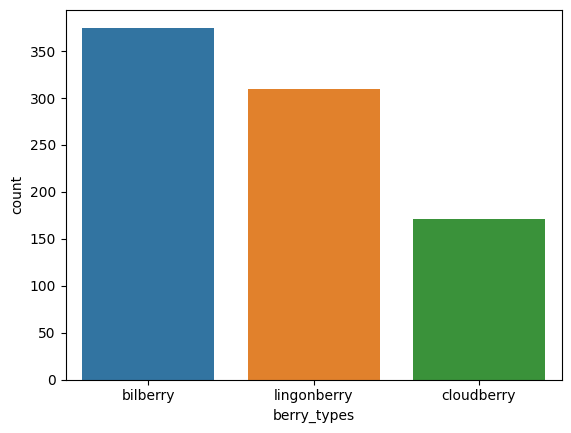

In [58]:
sns.countplot(x='berry_types', data=df_simple)

# Data set consist of 375 data for bilbery, 310 data for lingonberry and 171 data for cloudberry. 
# So the data set is not balanced in terms of berry types.

In [61]:
df_simple[df_simple['berry_types']=='bilberry']['berry_types'].count()

375

In [63]:
df_simple[df_simple['berry_types']=='lingonberry']['berry_types'].count()

310

In [62]:
df_simple[df_simple['berry_types']=='cloudberry']['berry_types'].count()

171

Text(0.5, 1.0, 'Berry types and observations over the years')

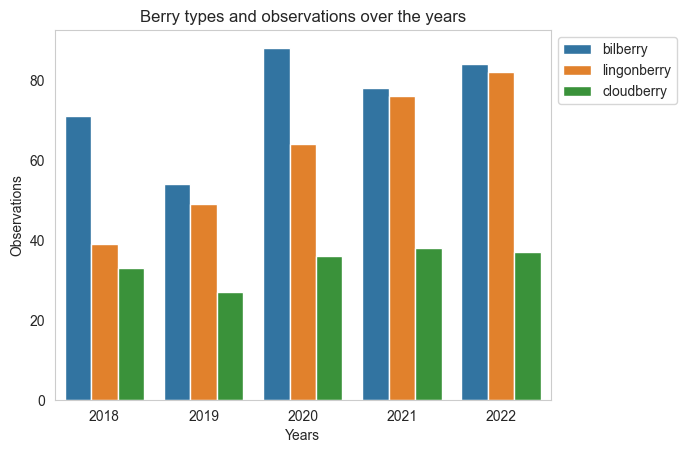

In [173]:
sns.countplot(x='year', data=df_simple, hue='berry_types')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

plt.xlabel("Years")
plt.ylabel("Observations")
plt.title("Berry types and observations over the years")

# Lingonberry observation consecutively increased over the years.

# Bilberry observation was minimum in 2019 and maximum in 2020.

# Cloudberry observation has the less volatility over the years.

In [63]:
# precip – the amount of liquid precipitation that fell or is predicted to fall in the period. 
# This includes the liquid-equivalent amount of any frozen precipitation such as snow or ice.

# precipcover (days only) – the proportion of hours where there was non-zero precipitation

# precipprob (forecast only) – the likelihood of measurable precipitation ranging from 0% to 100%

<AxesSubplot: xlabel='year', ylabel='precip'>

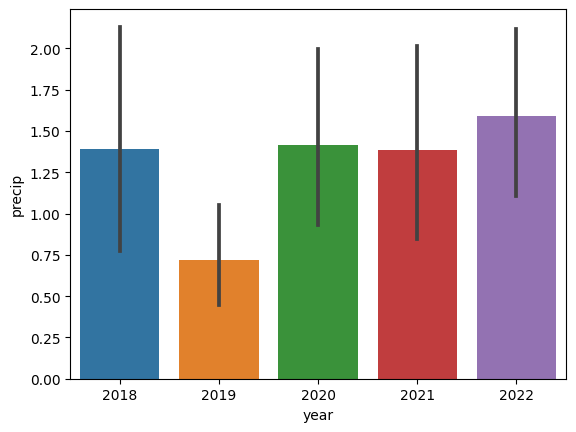

In [64]:
sns.barplot(x='year', y='precip', data=df_simple)


Text(0.5, 1.0, 'Precipitation vs Years vs Berry types')

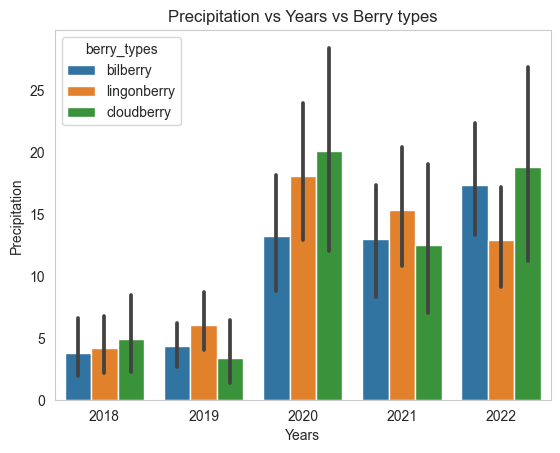

In [174]:
sns.barplot(x='year', y='precipcover', data=df_simple, hue='berry_types')

plt.xlabel("Years")
plt.ylabel("Precipitation")
plt.title("Precipitation vs Years vs Berry types")

# It is quite difficult to make analysis regarding berries` connection to precipitation due to the following reasons;
# In 2018 precipitationcover was lowest but precipitation is similar to 2020, 2021 and 2022,
# In 2020 precipitationcover is the highest but in 2022 precipitaton is the highest and generally total berry observation is similar,
# while bilberry observation is the highest with small difference in 2020.
# Precipcover variable gives the daily non-zero precipitation information and it cannot effect the observation immediately.
# Precip varibale gives information about precipitation that fell or is predicted to fall in the period but it would be much more better if the whole year precipitation data was present for better comparisons.
# In this regard weekly observations do not give valuable results though.

<AxesSubplot: xlabel='berry_types', ylabel='week_number'>

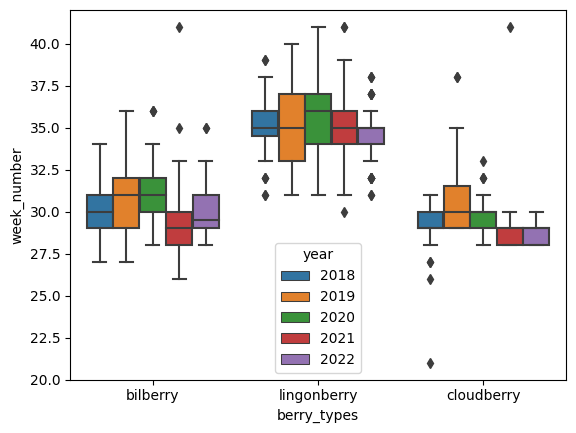

In [66]:
# Analysis together with the previous one
sns.boxplot(x='berry_types', y='week_number', data=df_simple, hue='year')

In [67]:
print('Precip: ', df_simple['precip'].sum())
print('Precipcover: ', df_simple['precipcover'].sum())
print()
print(f"2018 season average temperature: {round(df_simple[df_simple['year']==2018]['temperature'].mean(), 2)}")
print('Precip avg 2018: ', df_simple[df_simple['year']==2018]['precip'].mean().round(2))
print('Precipcover avg 2018: ', df_simple[df_simple['year']==2018]['precipcover'].mean().round(2))
print()
print("2019 season average temperature: ", df_simple[df_simple['year']==2019]['temperature'].mean().round(2))
print(f"Precip avg 2019:  {round(df_simple[df_simple['year']==2019]['precip'].mean(), 2)}")
print('Precipcover avg 2019: ', df_simple[df_simple['year']==2019]['precipcover'].mean().round(2))
print()
print(f"2020 season average temperature: {round(df_simple[df_simple['year']==2020]['temperature'].mean(), 2)}")
print('Precip avg 2020: ', df_simple[df_simple['year']==2020]['precip'].mean().round(2))
print('Precipcover avg 2020: ', df_simple[df_simple['year']==2020]['precipcover'].mean().round(2))
print()
print(f"2021 season average temperature: {round(df_simple[df_simple['year']==2021]['temperature'].mean(), 2)}")
print('Precip avg 2021: ', df_simple[df_simple['year']==2021]['precip'].mean().round(2))
print('Precipcover avg 2021: ', df_simple[df_simple['year']==2021]['precipcover'].mean().round(2))
print()
print(f"2022 season average temperature: {round(df_simple[df_simple['year']==2022]['temperature'].mean(), 2)}")
print('Precip avg 2022: ', df_simple[df_simple['year']==2022]['precip'].mean().round(2))
print('Precipcover avg 2022: ', df_simple[df_simple['year']==2022]['precipcover'].mean().round(2))

# 2018 is the driest year.

# 2020 is the most precipitation occured year.

# 2019 lowest temperature and precipitation occured year; accordingly less berry observation, especially lowest cloudberry observations among the years.

Precip:  1147.636
Precipcover:  10133.44

2018 season average temperature: 18.32
Precip avg 2018:  1.39
Precipcover avg 2018:  4.17

2019 season average temperature:  13.24
Precip avg 2019:  0.72
Precipcover avg 2019:  4.78

2020 season average temperature: 14.81
Precip avg 2020:  1.41
Precipcover avg 2020:  16.2

2021 season average temperature: 14.19
Precip avg 2021:  1.39
Precipcover avg 2021:  13.85

2022 season average temperature: 14.42
Precip avg 2022:  1.59
Precipcover avg 2022:  15.83


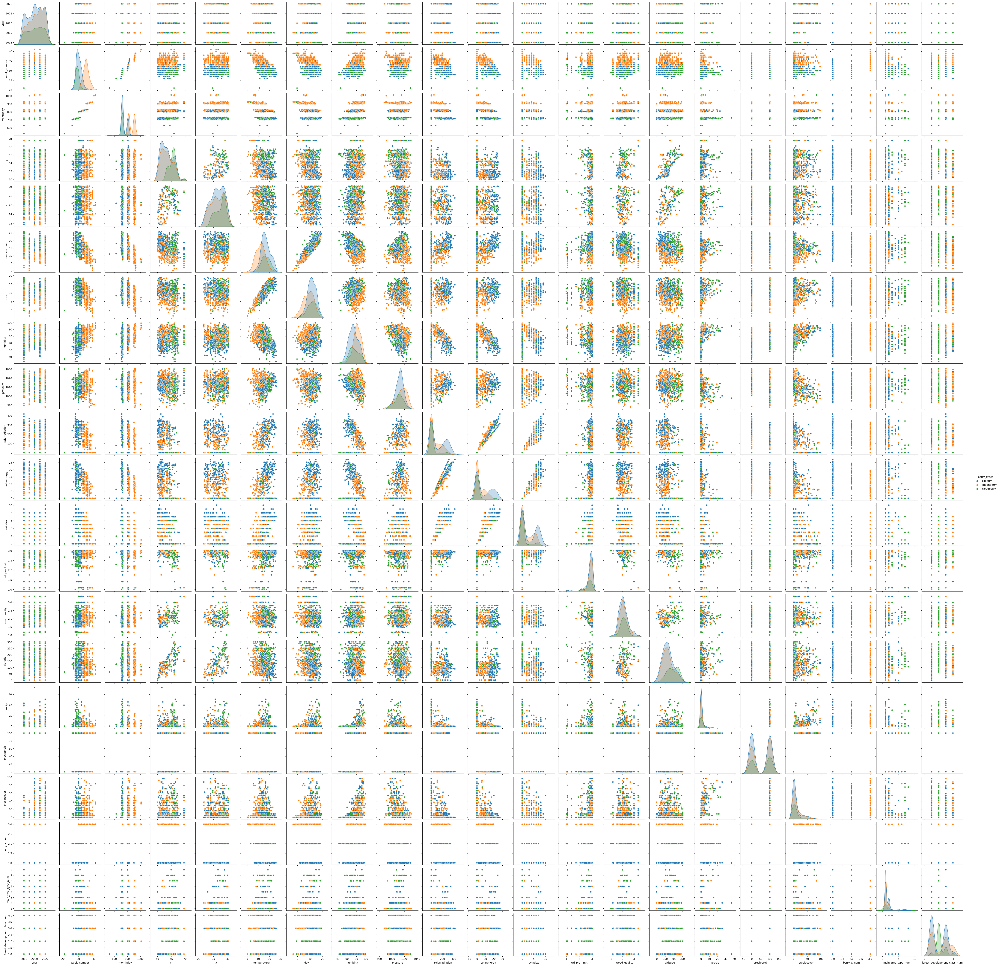

In [69]:
sns.pairplot(data = df_simple, hue='berry_types')

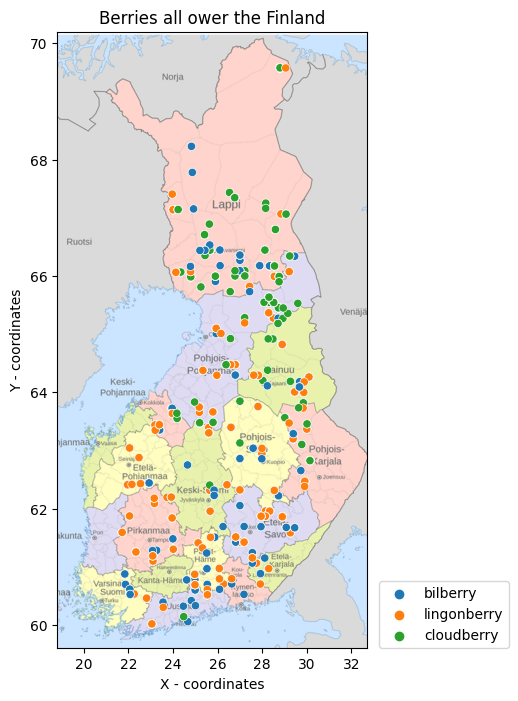

In [70]:
# Scatterplot with map of Finland for easier observation:
img = plt.imread('finlandmapregions.png')

fig, ax = plt.subplots(figsize=(4,8))
sns.scatterplot(x='x', y='y', data=df_simple, hue='berry_types')
plt.xlim(18.8000000, 32.70000)
plt.ylim(59.608100, 70.20000)
plt.legend(loc=(1.04, 0))
ax.imshow(img, extent=[18.70000, 33.300000, 59.408100, 70.20000], aspect='auto', alpha=1.0)
plt.xlabel("X - coordinates")
plt.ylabel("Y - coordinates")
plt.title("Berries all ower the Finland")
plt.show()

In [71]:
bilberry_df = df_simple[df_simple['berry_types'] == 'bilberry']

most_bilberry = bilberry_df.groupby(['berry_types', 'region', 'city_name'])['berry_types'].count().sort_values(ascending=False).to_frame()
most_bilberry

# The most bilberry observed city is Rovaniemi with 20 times in Lapland region.

berry_types
berry_types region              city_name                         
bilberry    Lapland             Rovaniemi                       20
            Eastern             Pieksamaki sub-region           10
            Northern            Taivalkoski                     10
                                Suomussalmi                      9
            Western and Central Kokkola sub-region               8
...                                                            ...
            Southern            Taipalsaari                      1
            Eastern             Mikkeli                          1
            Western             Joutsa                           1
                                Karstula                         1
            Eastern             Iisvesi                          1

[112 rows x 1 columns]

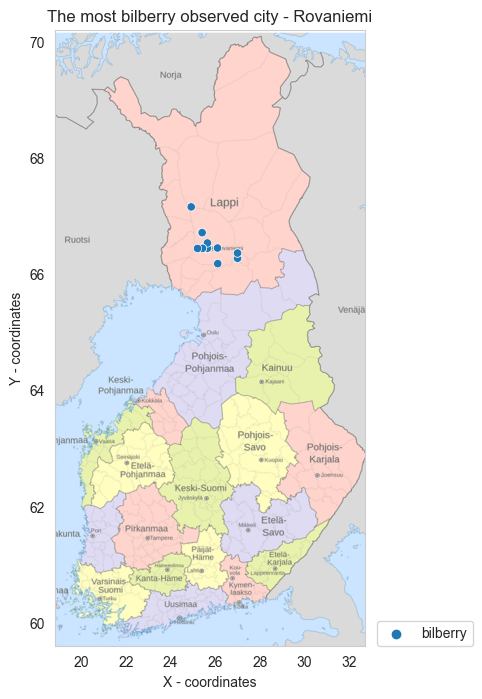

In [172]:
most_bilberry_city = bilberry_df[bilberry_df['city_name']=='Rovaniemi']

# Scatterplot with map of Finland for easier observation:
img = plt.imread('finlandmapregions.png')

fig, ax = plt.subplots(figsize=(4,8))
sns.scatterplot(x='x', y='y', data=most_bilberry_city, hue='berry_types')
plt.xlim(18.8000000, 32.70000)
plt.ylim(59.608100, 70.20000)
plt.legend(loc=(1.04, 0))
ax.imshow(img, extent=[18.70000, 33.300000, 59.408100, 70.20000], aspect='auto', alpha=1.0)
plt.xlabel("X - coordinates")
plt.ylabel("Y - coordinates")
plt.title("The most bilberry observed city - Rovaniemi")
plt.show()

In [73]:
cloudberry_df = df_simple[df_simple['berry_types'] == 'cloudberry']

most_cloudberry = cloudberry_df.groupby(['berry_types', 'region', 'city_name'])['berry_types'].count().sort_values(ascending=False).to_frame()
most_cloudberry

# The most cloudberry observed city is Taivalkoski with 31 times in Northern region.

berry_types
berry_types region              city_name                      
cloudberry  Northern            Taivalkoski                  31
            Lapland             Ranua                        14
            Northern            Kuusamo                      10
            Western             Pihtipudas                    9
            Lapland             Rovaniemi                     9
            Northern            Suomussalmi                   9
            Western and Central Kokkola sub-region            7
            Lapland             Tervola                       7
                                Salla                         7
            Eastern             Pielinen Karelia              6
            Lapland             Sevettijarvi                  6
            Northern            Jonkeri                       6
            Lapland             Kolari                        5
                                Posio                         5
            Northern            Vaala                         4
            Eastern             Joensuu                       4
            Lapland             Sodankyla                     4
            Northern            Oulu                          3
            Lapland             Kemijarvi                     3
            Northern            Pudasjarvi                    3
            Lapland             Tornio                        3
            Northern            Oulujarvi                     2
            Lapland             Savukoski                     2
                                Simo                          1
            Northern            Nivala                        1
            Lapland             Simojarvi                     1
            Northern            Paltamo                       1
            Eastern             Maaninka                      1
            Northern            Puolanka                      1
                                Sotkamo                       1
                                Hietapera                     1
            Eastern             Vierema                       1
            Southern            Jolkby                        1
            Eastern             Rantasalmi                    1
            Western             Tikkakoski                    1

In [74]:
lingonberry_df = df_simple[df_simple['berry_types'] == 'lingonberry']

most_lingonberry = lingonberry_df.groupby(['berry_types', 'region', 'city_name'])['berry_types'].count().sort_values(ascending=False).to_frame()
most_lingonberry

# The most lingonberry observed city is Taivalkoski with 14 times in Northen region.

berry_types
berry_types region   city_name                         
lingonberry Northern Taivalkoski                     14
            Eastern  Pieksamaki sub-region           10
            Southern Riihimaki sub-region             9
            Western  Pihtipudas                       8
            Northern Suomussalmi                      8
...                                                 ...
            Eastern  Talvisalo                        1
                     Vierema                          1
            Southern Orimattila                       1
            Lapland  Lapland                          1
            Southern Pukkila                          1

[85 rows x 1 columns]

In [75]:
most_observation_city = df_simple.groupby(['region', 'city_name'])['city_name'].count().sort_values(ascending=False).to_frame()
most_observation_city

# Regardles of the berry type, the most observed city together with berries is Taivalkoski with 55 times in Northern region.

city_name
region   city_name             
Northern Taivalkoski         55
Lapland  Rovaniemi           37
Northern Suomussalmi         26
Western  Pihtipudas          25
Northern Kuusamo             25
...                         ...
         Paltamo              1
Western  Joutsa               1
Northern Lentua               1
Southern Taipalsaari          1
Western  Paijanne             1

[128 rows x 1 columns]

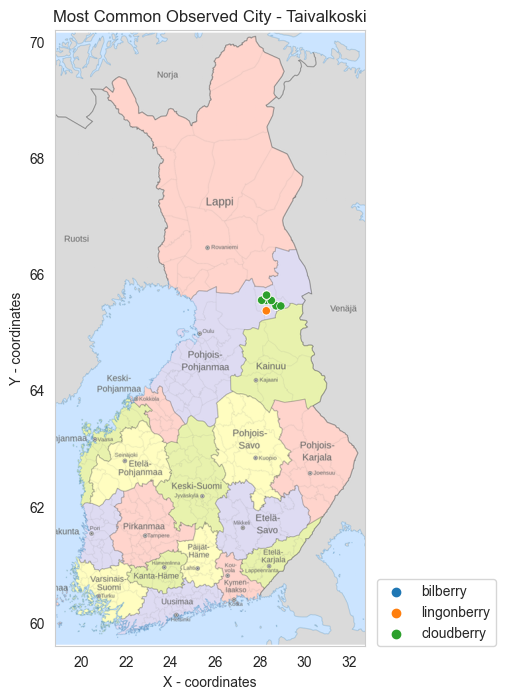

In [171]:
# Having the most observed city 
most_common_city = df_simple[df_simple['city_name']=='Taivalkoski']

# Scatterplot with map of Finland for easier observation:
img = plt.imread('finlandmapregions.png')

fig, ax = plt.subplots(figsize=(4,8))
sns.scatterplot(x='x', y='y', data=most_common_city, hue='berry_types')
plt.xlim(18.8000000, 32.70000)
plt.ylim(59.608100, 70.20000)
plt.legend(loc=(1.04, 0))
ax.imshow(img, extent=[18.70000, 32.90000, 59.458100, 70.20000], aspect='auto', alpha=1.0)
plt.xlabel("X - coordinates")
plt.ylabel("Y - coordinates")
plt.title("Most Common Observed City - Taivalkoski")
plt.show()

In [170]:
regions_with_berries = df_simple.groupby(['berry_types', 'region']).sum()['berry_x_num'].to_frame()
regions_with_berries

# (The regions are categorized based on the observation coordinates that is matching in the Bigdata source)

# The most bilberry observed region is Western Finland with 88 times and the least one is Western and Central Finland with 8 times.

# The most cloudberry observed region is Northern Finland with 146 times and the least one is Southern Finland with 2 times.

# The most lingonberry observed region is Northern Finland with 234 times  and the least one is Western and Central Finland with 18 times.

C:\Users\MLDE\AppData\Local\Temp\ipykernel_3632\742377604.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  regions_with_berries = df_simple.groupby(['berry_types', 'region']).sum()['berry_x_num'].to_frame()


berry_x_num
berry_types region                          
bilberry    Eastern                       76
            Lapland                       65
            Northern                      80
            Southern                      58
            Western                       88
            Western and Central            8
cloudberry  Eastern                       26
            Lapland                      134
            Northern                     146
            Southern                       2
            Western                       20
            Western and Central           14
lingonberry Eastern                      198
            Lapland                      132
            Northern                     234
            Southern                     126
            Western                      222
            Western and Central           18

In [78]:
highest_3 = df_simple.sort_values(by=['altitude'], ascending=False).drop_duplicates('altitude',keep='last').head(3)

# At the 3 distinct highest altitude levels in data set observations are respectively as follows;

    # elevations are 302.4m, 302.2m and 293.8m
    # city is Kuusamo in Northern region
    # berry types are cloudberries and lingonberry
    # tree type is only pine
    # observation dates are 2019-08-06, 2022-08-26 and 2022-07-23
    # temperatures are 7.4, 14.8, 16.2
    # wood qualities are 2.0, 2.55 and 2.50
    # forest classes are plantation and old

highest_3[['berry_types', 'observation_date', 'main_tree_type','x', 'y', 'temperature',  'wood_quality', 'city_name', 'region', 'altitude', 'forest_development_class']]

,berry_types,observation_date,main_tree_type,x,y,temperature,wood_quality,city_name,region,altitude,forest_development_class
549,lingonberry,2022-08-26,pine,29.210146,66.074704,14.8,2.555556,Kuusamo,Northern,302,plantation
750,cloudberry,2022-07-23,pine,28.756038,65.901050,16.2,2.500000,Kuusamo,Northern,293,plantation
339,lingonberry,2018-08-14,pine,28.542033,65.993087,8.1,3.000000,Kuusamo,Northern,289,old


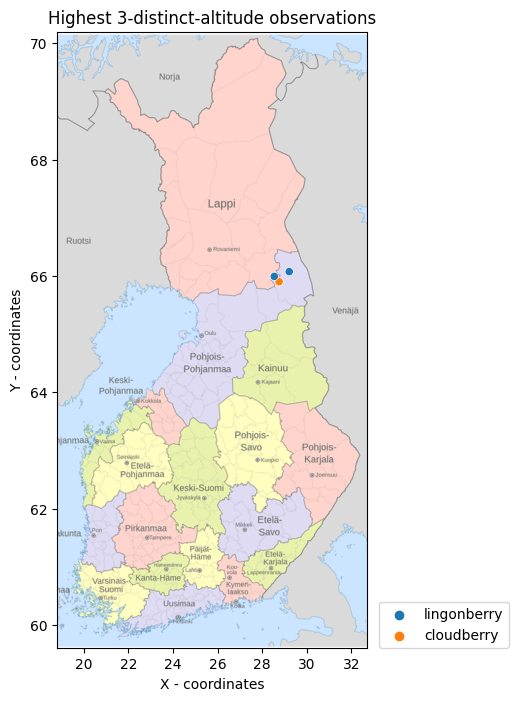

In [79]:
# Scatterplot with map of Finland for easier observation:
img = plt.imread('finlandmapregions.png')

fig, ax = plt.subplots(figsize=(4,8))
sns.scatterplot(x='x', y='y', data=highest_3, hue='berry_types')
plt.xlim(18.8000000, 32.70000)
plt.ylim(59.608100, 70.20000)
plt.legend(loc=(1.04, 0))
ax.imshow(img, extent=[18.70000, 32.90000, 59.458100, 70.20000], aspect='auto', alpha=1.0)
plt.xlabel("X - coordinates")
plt.ylabel("Y - coordinates")
plt.title("Highest 3-distinct-altitude observations")
plt.show()

In [80]:
lowest_3 = df_simple.sort_values(by=['altitude'], ascending=True).drop_duplicates('altitude',keep='last').head(3)

# At the 3 distinct lowest altitude levels in data set observations are respectively as follows;

    # elevations are -4.1m, 0.7m and 12.5m
    # cities are Hirsala, Bromarf and Jolkby in Southern region
    # berry types are bilberry, lingonberry and cloudberry 
    # tree types are generally pine
    # observation dates are 2018-08-08, 2020-08-31 and 2018-07-20
    # temperatures are 18.2, 13.4 and 20.5
    # wood qualities are 2.0, 2.3 and 2.7
    # forest class is only old

lowest_3[['berry_types', 'observation_date', 'main_tree_type','temperature','x', 'y', 'wood_quality', 'city_name', 'region', 'altitude','forest_development_class']]

,berry_types,observation_date,main_tree_type,temperature,x,y,wood_quality,city_name,region,altitude,forest_development_class
236,bilberry,2018-08-08,mixed,18.2,24.665010,60.056504,2.000000,Hirsala,Southern,-4,old
62,bilberry,2018-07-23,larch,21.3,23.052028,60.018137,2.375000,Bromarf,Southern,0,old
407,cloudberry,2018-07-20,pine,20.5,24.478742,60.142916,2.785714,Jolkby,Southern,12,old


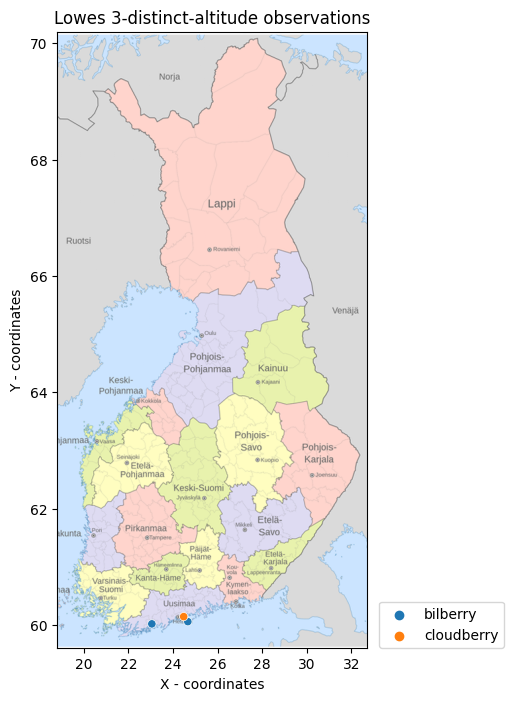

In [81]:
# Scatterplot with map of Finland for easier observation:
img = plt.imread('finlandmapregions.png')

# fig, ax = plt.subplots(figsize=(4,8))
img = plt.imread('finlandmapregions.png')

fig, ax = plt.subplots(figsize=(4,8))
sns.scatterplot(x='x', y='y', data=lowest_3, hue='berry_types')
plt.xlim(18.8000000, 32.70000)
plt.ylim(59.608100, 70.20000)
plt.legend(loc=(1.04, 0))
ax.imshow(img, extent=[18.70000, 32.90000, 59.458100, 70.20000], aspect='auto', alpha=1.0)
plt.xlabel("X - coordinates")
plt.ylabel("Y - coordinates")
plt.title("Lowes 3-distinct-altitude observations")
plt.show()

<AxesSubplot: xlabel='altitude', ylabel='week_number'>

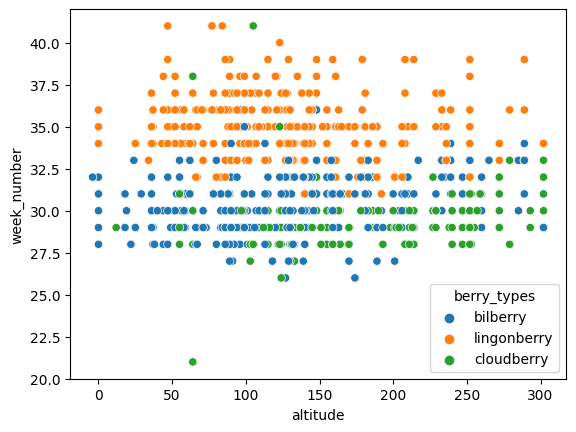

In [82]:
sns.scatterplot(x='altitude', y='week_number', data=df_simple, hue='berry_types')

# All berry types are observed in all altitudes but below 100m cloudberry and above 250m lingonberry 
# are less likely.

5 years` season average temperature: 14.93


Text(0.5, 1.0, 'Week numbers vs Temperature')

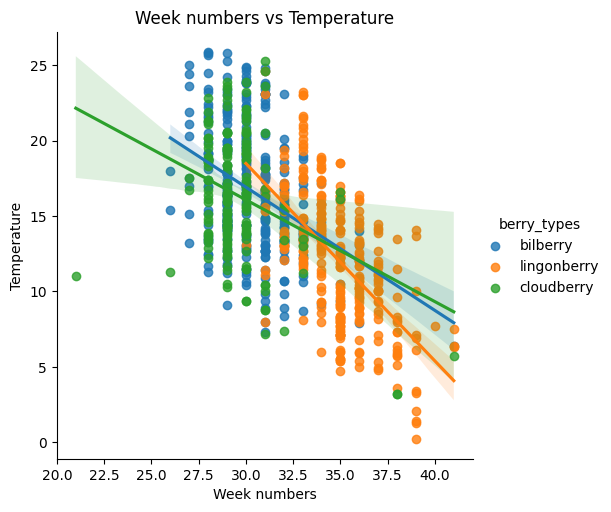

In [83]:
# All years temperaturereatures
sns.lmplot(x='week_number', y='temperature', data=df_simple, hue='berry_types')
print(f"5 years` season average temperature: {round(df_simple['temperature'].mean(), 2)}")

plt.xlabel("Week numbers")
plt.ylabel("Temperature")
plt.title("Week numbers vs Temperature")

# 2018 is warmest year in the data set with average of 18.32 °C in the season
# Other years` average temperature is around 14 °C in the season
# Accordingly first cloudberry observation was 4-6 weeks earlier than other years.


Text(0.5, 1.0, 'Week numbers vs Temperature')

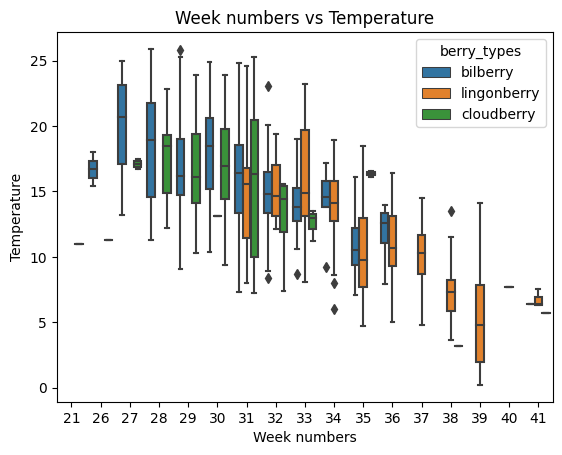

In [84]:

sns.boxplot(x='week_number', y='temperature', data=df_simple, hue='berry_types')

plt.xlabel("Week numbers")
plt.ylabel("Temperature")
plt.title("Week numbers vs Temperature")


# All berry types were observed when temperatures were decreasing, exceptionally;
# Cloudberries were observed when temperature was increasing.

Text(0.5, 1.0, 'Altitudes vs Week numbers')

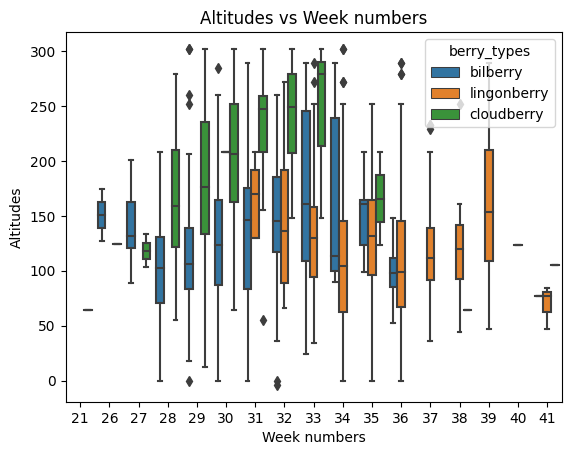

In [85]:

sns.boxplot(x='week_number', y='altitude', data=df_simple, hue='berry_types')

plt.xlabel("Week numbers")
plt.ylabel("Altitudes")
plt.title("Altitudes vs Week numbers")

# When week number increase temperature increase, when temperature increase, berries start to be observed at higher altitudes.
# Cloudberry observation occurs at higher altitudes than bilberry and lingonberry. 

# Mostly first cloudberries and bilberies were observed around 26th-28th week when the temperature was between 12°C and 15°C.
# Lingonberries observation start at 31th week.

# Mostly cloudberries and bilberies observation end around 33th-34th week. 
# Lingonberry observation ends around 41th week.

Text(0.5, 1.0, 'Week numbers vs Regions')

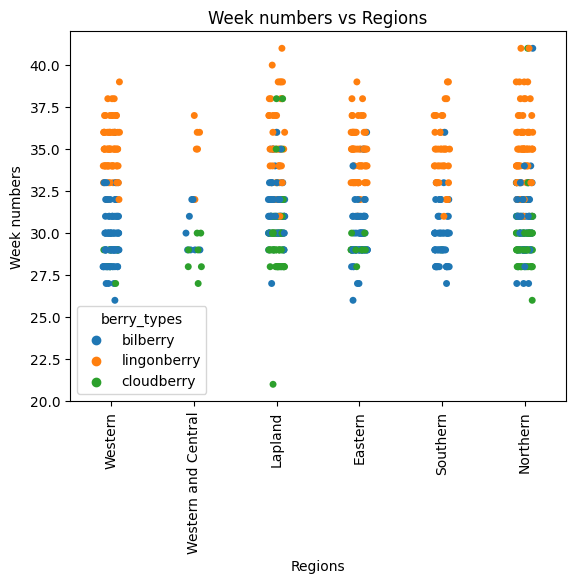

In [86]:
plt.xticks(rotation=90)
sns.stripplot(x='region', y='week_number', data=df_simple, hue='berry_types')

plt.xlabel("Regions")
plt.ylabel("Week numbers")
plt.title("Week numbers vs Regions")

# Cloudberry observation in Western and Southern Finland is very rare.

# While bilberies and lingonberries observation last around 8 weeks, cloudberries observation last around 5 weeks,
# more densly 3 weeks over the regions.

Text(0.5, 1.0, 'Temperature vs Humidity')

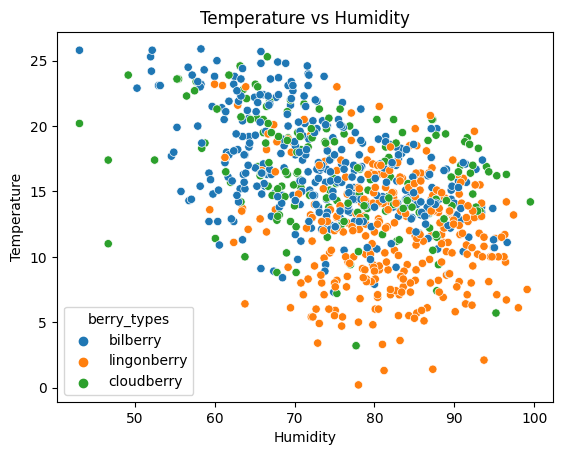

In [87]:
sns.scatterplot(x='humidity', y='temperature', data=df_simple, hue='berry_types')

plt.xlabel("Humidity")
plt.ylabel("Temperature")
plt.title("Temperature vs Humidity")

# Lingonberry mostly observed below 20 °C and above 70% humidity.
# Below 5°C only lingonberry observed, except cloudberry outlayer.

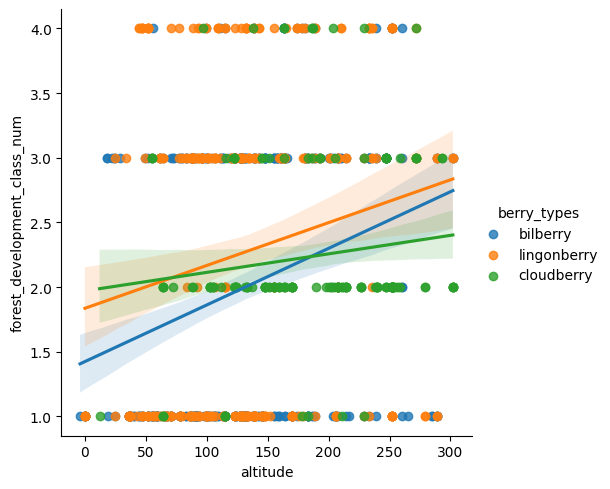

In [88]:
sns.lmplot(x='altitude', y='forest_development_class_num', data=df_simple, hue='berry_types')

# All berry types have better observation at clearing forest development class.

<AxesSubplot: xlabel='week_number', ylabel='forest_development_class_num'>

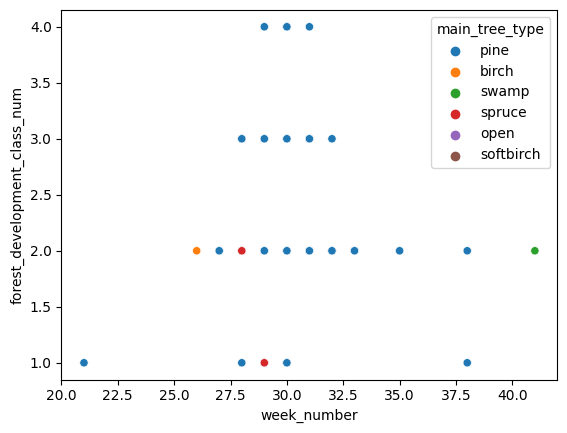

In [91]:
sns.scatterplot(x='week_number', y='forest_development_class_num', data=cloudberry_df, hue='main_tree_type')

# While generally cloudberries observation period is shorter than others, at swamp and pine tree type and,
# in clearing forest development class, it lasts longer.

<AxesSubplot: xlabel='year', ylabel='week_number'>

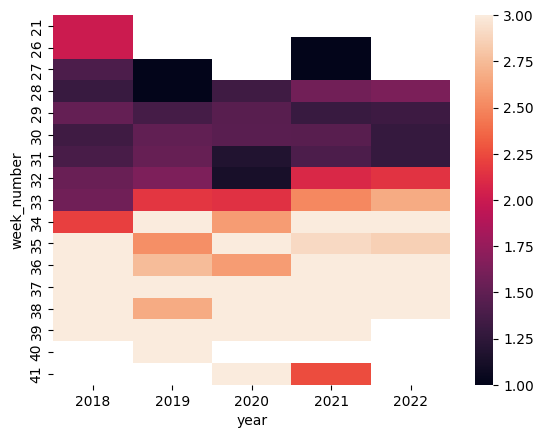

In [92]:
# Can be used for visual purpose
pt_berry = df_simple.pivot_table(index='week_number', columns='year', values='berry_x_num')
sns.heatmap(pt_berry)

<AxesSubplot: xlabel='week_number', ylabel='humidity'>

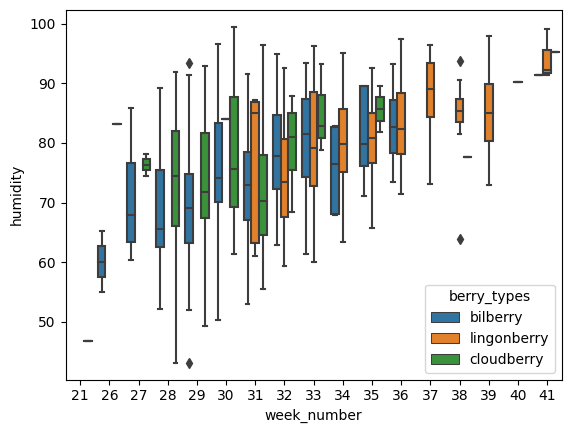

In [93]:
sns.boxplot(x='week_number', y='humidity', data=df_simple, hue='berry_types')

Text(0.5, 1.0, 'Temperatures vs Altitudes')

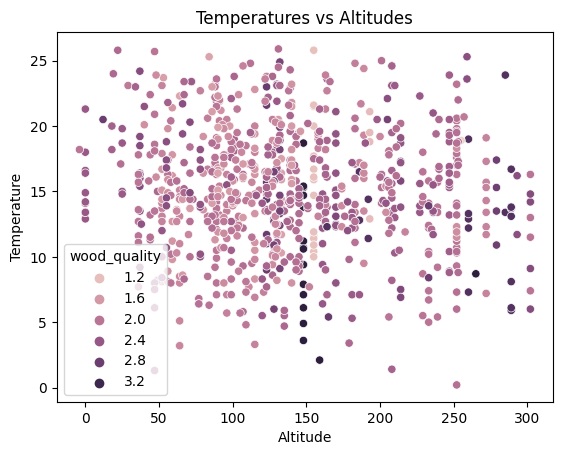

In [94]:
sns.scatterplot(x='altitude', y='temperature', data=df_simple, hue='wood_quality')

# Best wood qualities are observed after 150m altitude.

plt.xlabel("Altitude")
plt.ylabel("Temperature")
plt.title("Temperatures vs Altitudes")

In [95]:
df_simple[df_simple['forest_development_class'] == 'clearing']['altitude'].min()

64

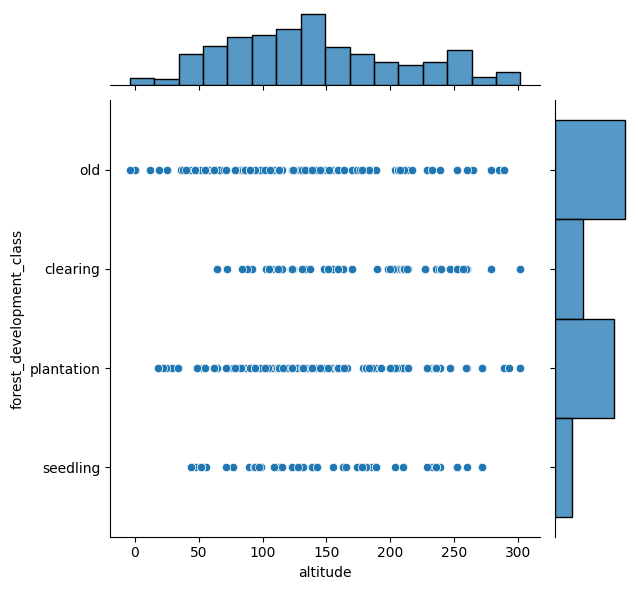

In [96]:
sns.jointplot(x='altitude', y='forest_development_class', data=df_simple)

# Clearing forest were observed after 60m altitudes.

In [97]:
df_simple[df_simple['main_tree_type'] == 'larch']['altitude']

62    0
64    0
66    0
68    0
70    0
Name: altitude, dtype: int32

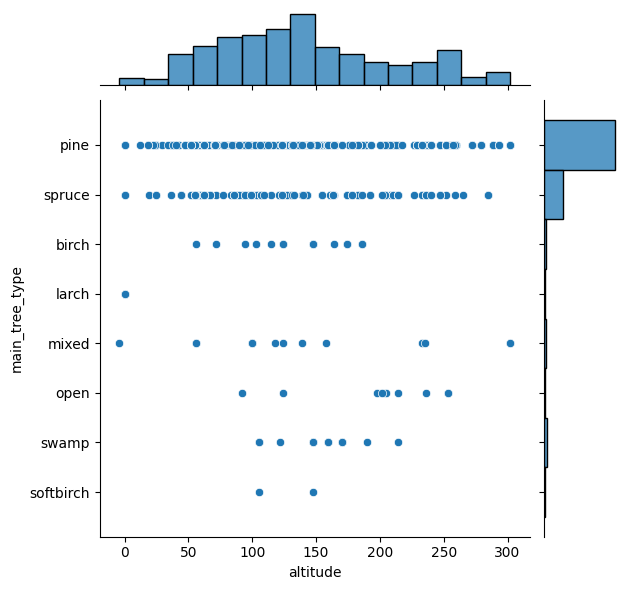

In [98]:
sns.jointplot(x='altitude', y='main_tree_type', data=df_simple)

# Pine and spurce are most common observed two main tree types and they are observed in all altitudes,
# after them, birch is observed less likely tree type.

# Swamp areas were observed between 100m and 230m.

# ??Few larch were observed nearby 0m level??. Maybe lackof data, or some error.

<AxesSubplot: >

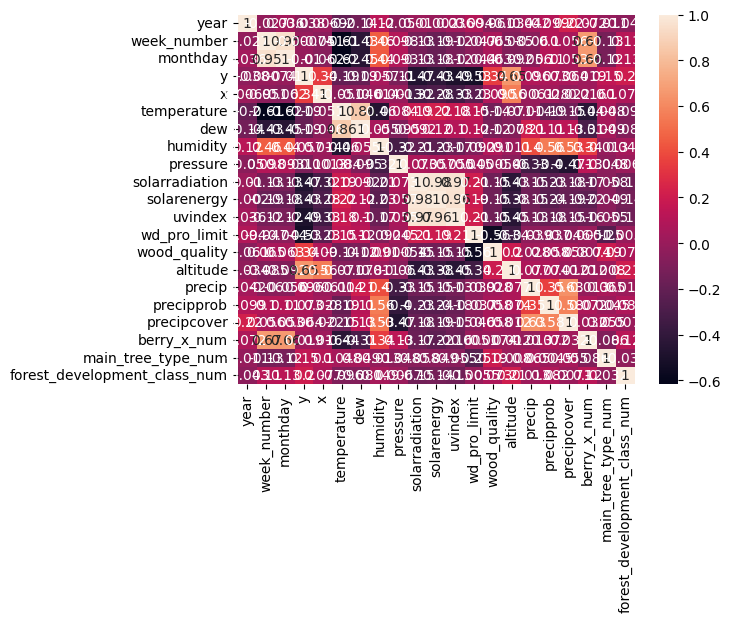

In [99]:
# Due to many columns dtale gives better results in correlations, export image work well.

correlation = df_simple.corr(numeric_only=True)
sns.heatmap(correlation, annot=True)

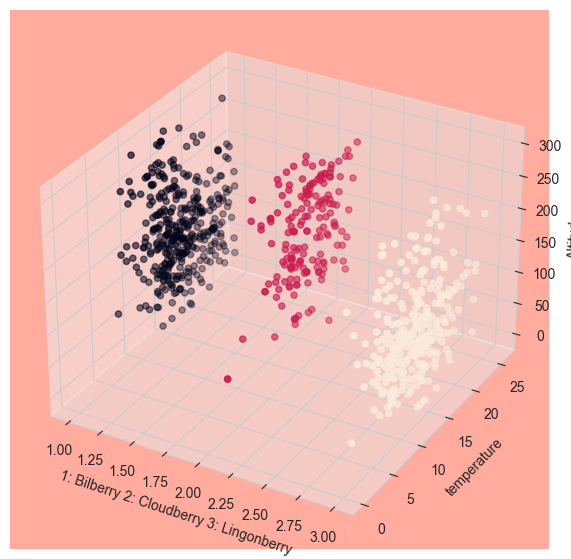

In [100]:
# Just for visual purposes, 3D // altitude axis is not readable well.

import re, seaborn as sns, numpy as np, pandas as pd, random
from pylab import *
from matplotlib.pyplot import plot, show, draw, figure, cm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
sns.set_style("whitegrid", {'axes.grid' : False})

fig = plt.figure(figsize=(8,7))

ax = Axes3D(fig) # Method 1
ax = fig.add_subplot(111, projection='3d') # Method 2

x = df_simple['berry_x_num']
y = df_simple['temperature']
z = df_simple['altitude']


ax.scatter(x, y, z, c=x, marker='o')
ax.set_xlabel('1: Bilberry 2: Cloudberry 3: Lingonberry')
ax.set_ylabel('temperature')
ax.set_zlabel('Altitudes')
ax.set_facecolor('xkcd:salmon')
ax.set_facecolor((1.0, 0.67, 0.62))
ax.xaxis.set_label_coords(1.05, 2, -3)


plt.show()

# Below are solarenergy, uvindex and solarradiation plots.
But in data set there were only 348 data were present for each column, rest None were replaced with zeros.

So, evaluting them with berries is quite difficult.

But their correlations with coordinates and altitudes are valuable.

--- Comments end here.


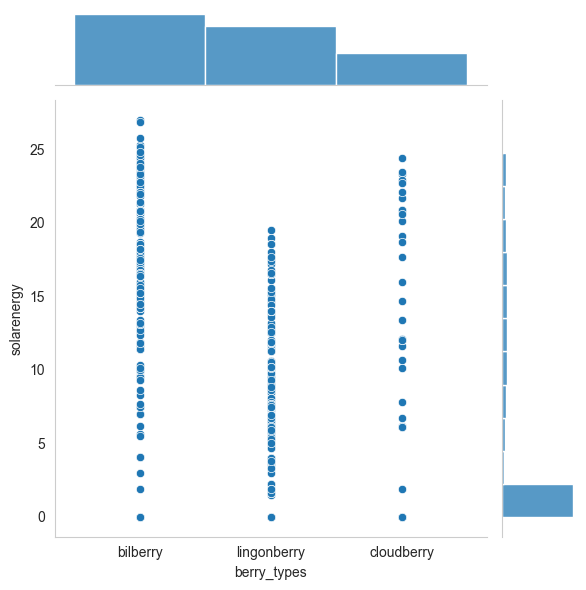

In [101]:
sns.jointplot(x='berry_types', y='solarenergy', data=df_simple)

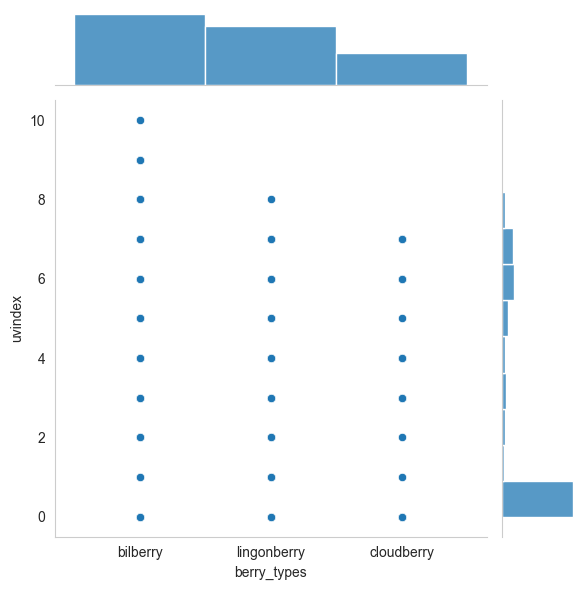

In [102]:
sns.jointplot(x='berry_types', y='uvindex', data=df_simple)

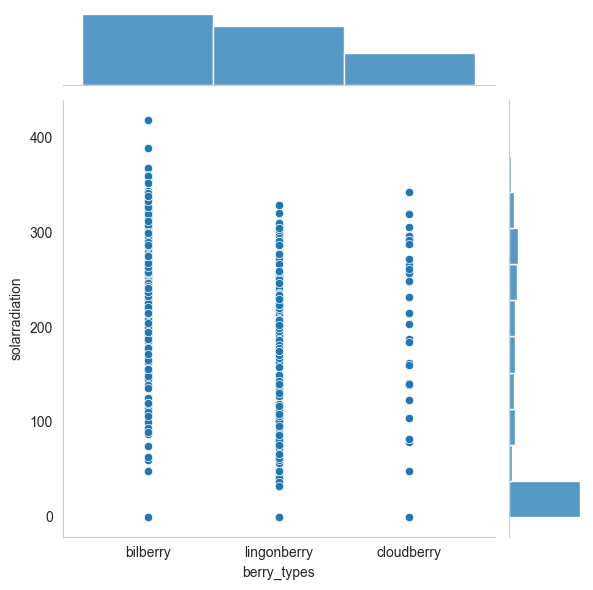

In [103]:
sns.jointplot(x='berry_types', y='solarradiation', data=df_simple)

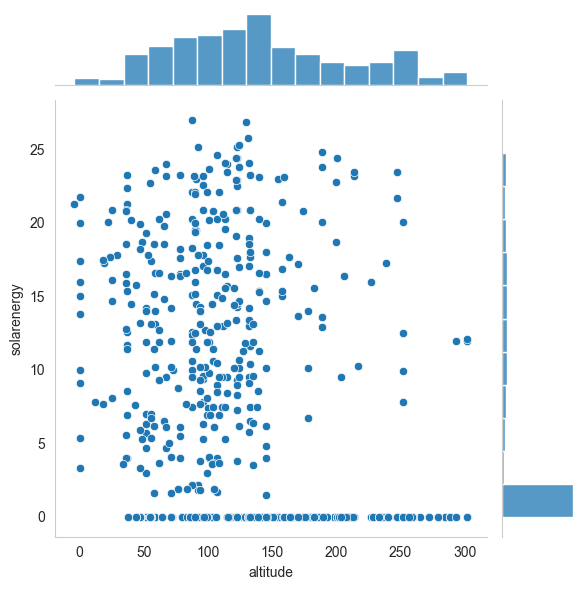

In [104]:
sns.jointplot(x='altitude', y='solarenergy', data=df_simple)

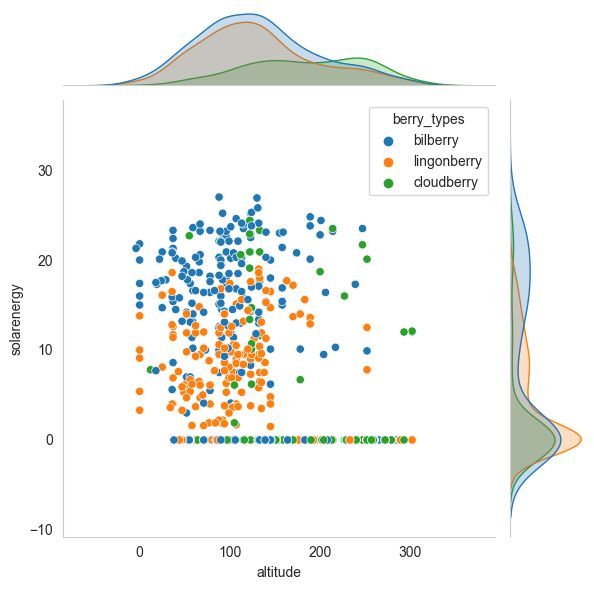

In [105]:
sns.jointplot(x='altitude', y='solarenergy', data=df_simple, hue='berry_types')

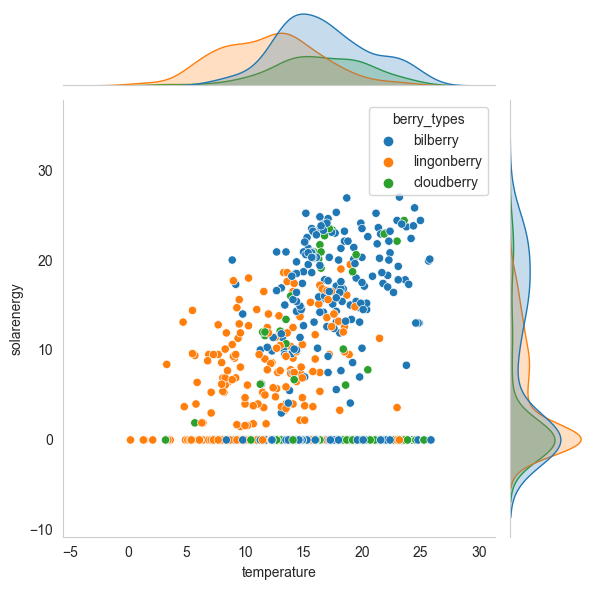

In [106]:
sns.jointplot(x='temperature', y='solarenergy', data=df_simple, hue='berry_types')

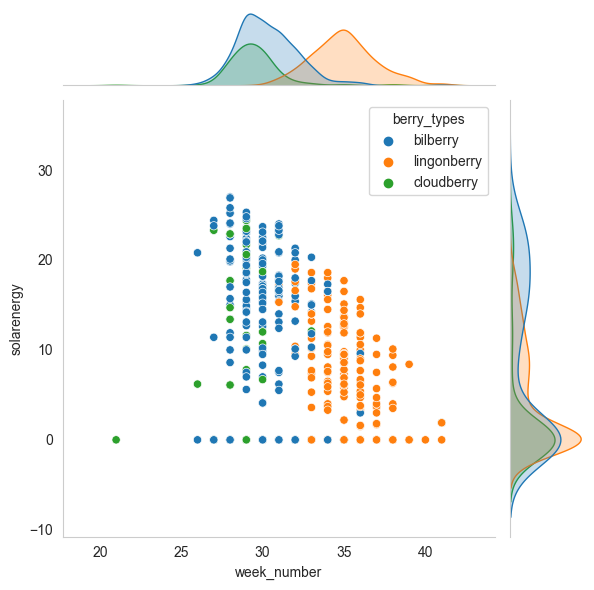

In [107]:
sns.jointplot(x='week_number', y='solarenergy', data=df_simple, hue='berry_types')

In [108]:
df_simple.columns

Index(['berry_types', 'observation_date', 'main_tree_type',
       'forest_development_class', 'year', 'week_number', 'monthday', 'y', 'x',
       'temperature', 'dew', 'humidity', 'pressure', 'solarradiation',
       'solarenergy', 'uvindex', 'wd_pro_limit', 'wood_quality', 'city_name',
       'region', 'altitude', 'precip', 'precipprob', 'precipcover',
       'berry_x_num', 'main_tree_type_num', 'forest_development_class_num'],
      dtype='object')

# Below here; plots are producef for exploration purposes, valuable were commented and pull to above this comment

In [109]:
# Having the altitudes separated into 3 levels
df_high = df_simple.query('altitude > altitude.quantile(q=0.66)')
df_mid = df_simple.query('altitude >= altitude.quantile(q=0.33) and altitude <= altitude.quantile(q=0.66)')
df_low = df_simple.query('altitude < altitude.quantile(q=0.33)')


# Having the berries as separated into types
df_bilberry = df_simple[df_simple['berry_types'].isin(['bilberry'])]
df_lingonberry = df_simple[df_simple['berry_types'].isin(['lingonberry'])]
df_cloudberry = df_simple[df_simple['berry_types'].isin(['cloudberry'])]

<AxesSubplot: xlabel='altitude', ylabel='temperature'>

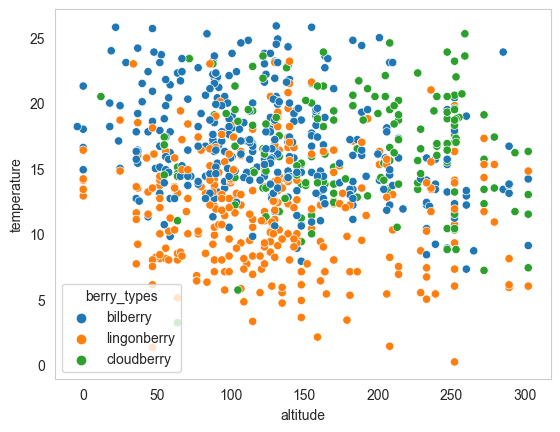

In [110]:
sns.scatterplot(x='altitude', y='temperature', data=df_simple, hue='berry_types')


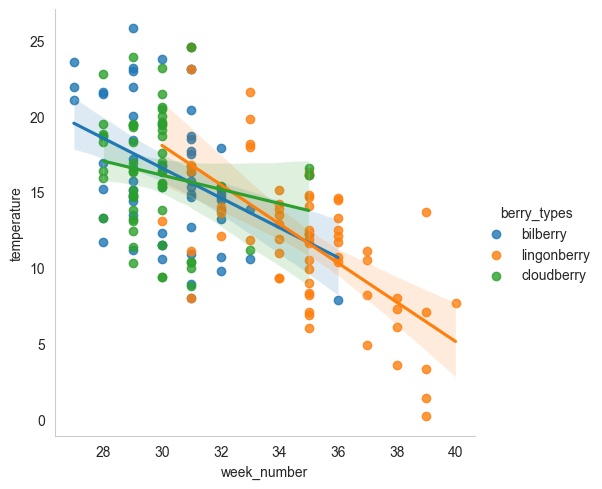

In [111]:
sns.lmplot(x='week_number', y='temperature', data=df_top_alt, hue='berry_types')

2018 season average temperature: 18.32


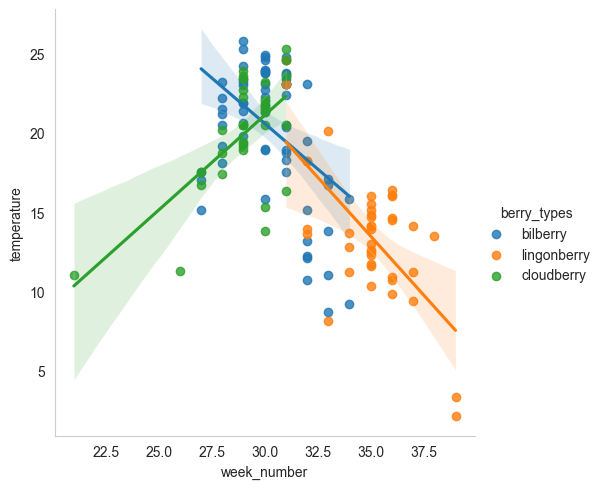

In [112]:
# 2018 year`s temperatures vs week
sns.lmplot(x='week_number', y='temperature', data=data_2018, hue='berry_types')
print(f"2018 season average temperature: {round(data_2018['temperature'].mean(), 2)}")

2019 season average temperature: 13.24


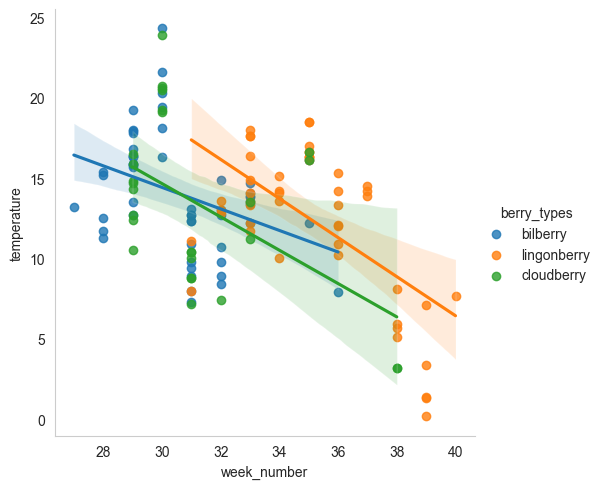

In [113]:
# 2019 year`s temperatures vs week
sns.lmplot(x='week_number', y='temperature', data=data_2019, hue='berry_types')
print(f"2019 season average temperature: {round(data_2019['temperature'].mean(), 2)}")

2020 season average temperature: 14.81


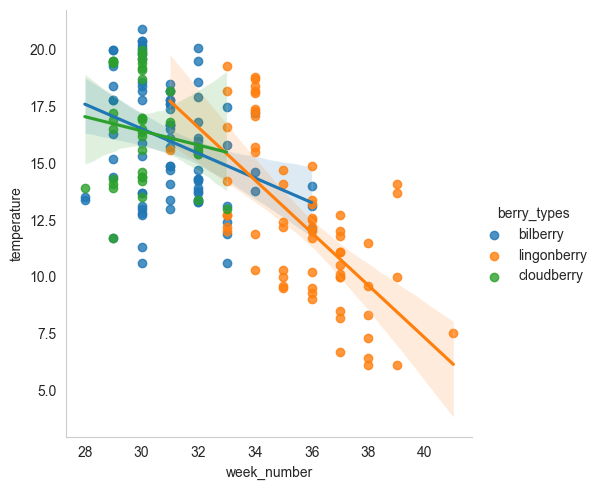

In [114]:
# 2020 year`s temperatures vs week
sns.lmplot(x='week_number', y='temperature', data=data_2020, hue='berry_types')
print(f"2020 season average temperature: {round(data_2020['temperature'].mean(), 2)}")

2021 season average temperature: 14.19


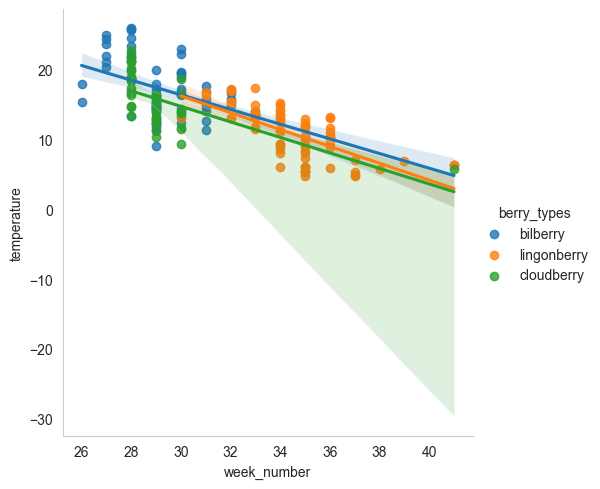

In [115]:
# 2021 year`s temperatures vs week
sns.lmplot(x='week_number', y='temperature', data=data_2021, hue='berry_types')
print(f"2021 season average temperature: {round(data_2021['temperature'].mean(), 2)}")

2022 season average temperature: 14.42


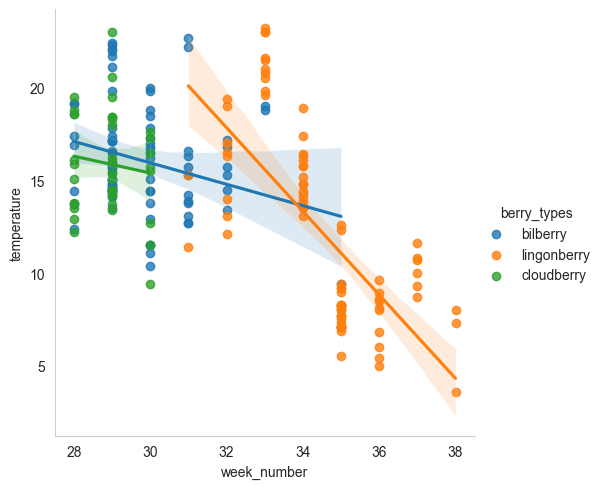

In [116]:
# 2022 year`s temperatures vs week
sns.lmplot(x='week_number', y='temperature', data=data_2022, hue='berry_types')
print(f"2022 season average temperature: {round(data_2022['temperature'].mean(), 2)}")

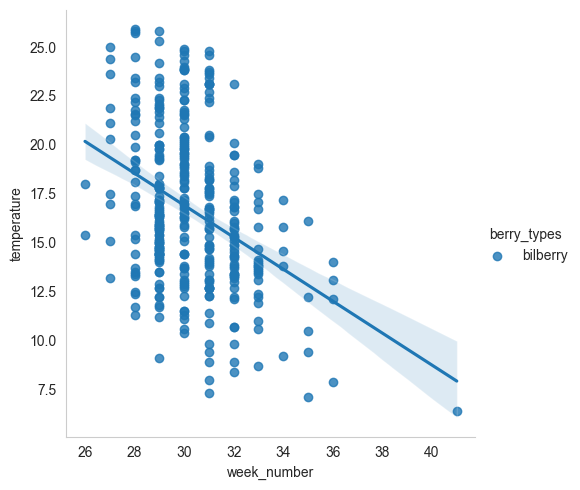

In [117]:
sns.lmplot(x='week_number', y='temperature', data=df_bilberry, hue='berry_types')

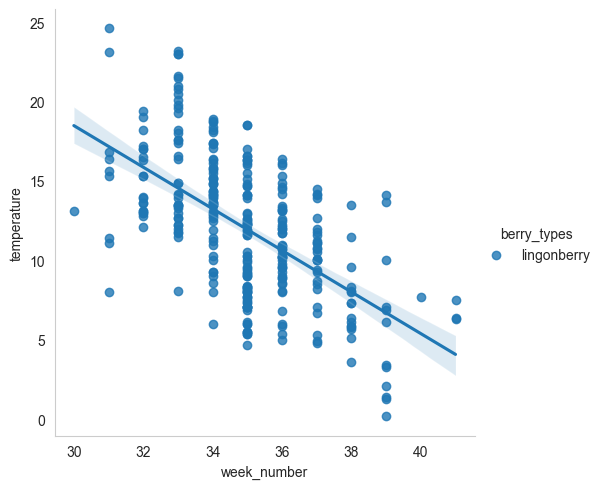

In [118]:
sns.lmplot(x='week_number', y='temperature', data=df_lingonberry, hue='berry_types')

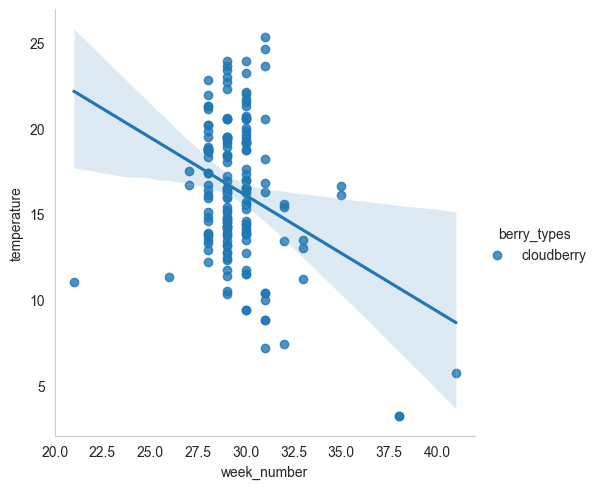

In [119]:
sns.lmplot(x='week_number', y='temperature', data=df_cloudberry, hue='berry_types')

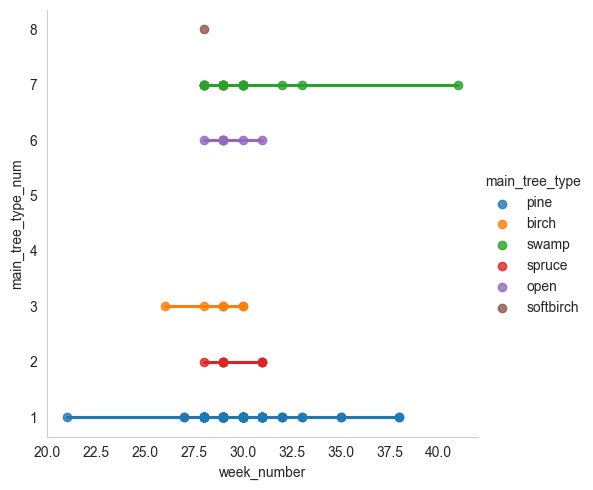

In [120]:
sns.lmplot(x='week_number', y='main_tree_type_num', data=df_cloudberry, hue='main_tree_type')

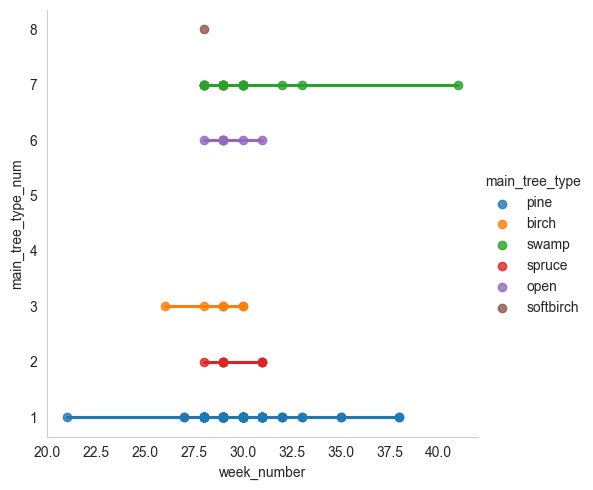

In [121]:
sns.lmplot(x='week_number', y='main_tree_type_num', data=df_cloudberry, hue='main_tree_type')

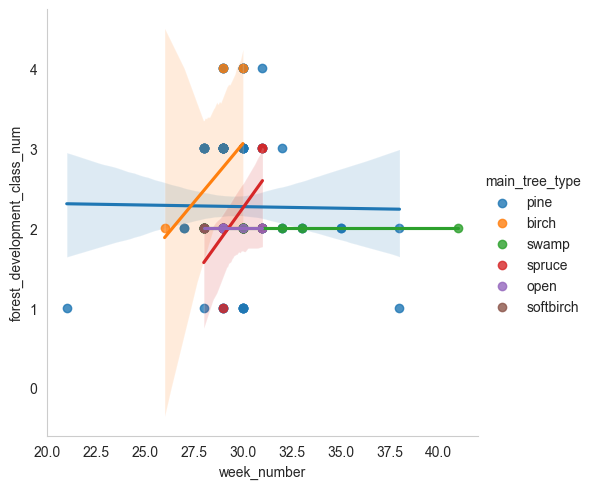

In [122]:
sns.lmplot(x='week_number', y='forest_development_class_num', data=df_cloudberry, hue='main_tree_type')

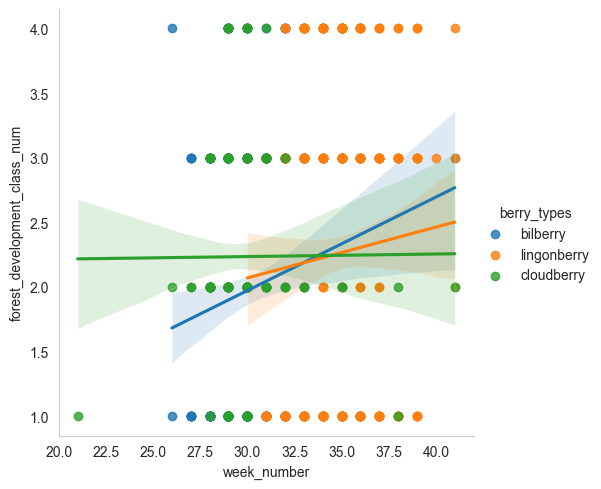

In [123]:
sns.lmplot(x='week_number', y='forest_development_class_num', data=df_simple, hue='berry_types')


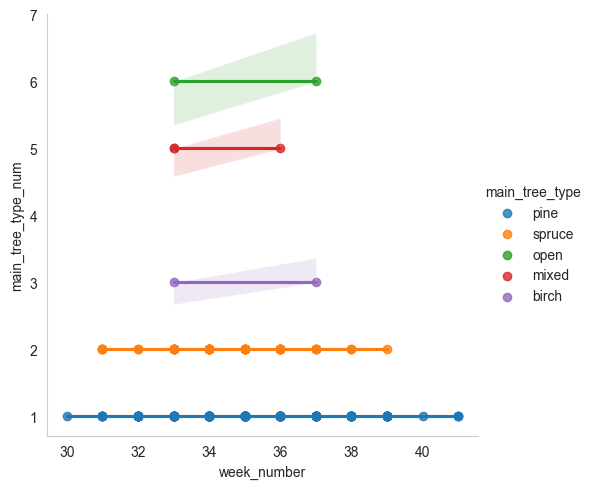

In [124]:
sns.lmplot(x='week_number', y='main_tree_type_num', data=df_lingonberry, hue='main_tree_type')

<AxesSubplot: xlabel='week_number', ylabel='main_tree_type'>

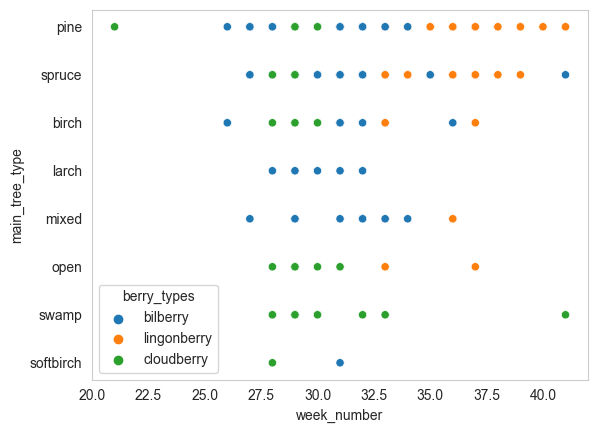

In [125]:
sns.scatterplot(x='week_number', y='main_tree_type', data=df_simple, hue='berry_types')

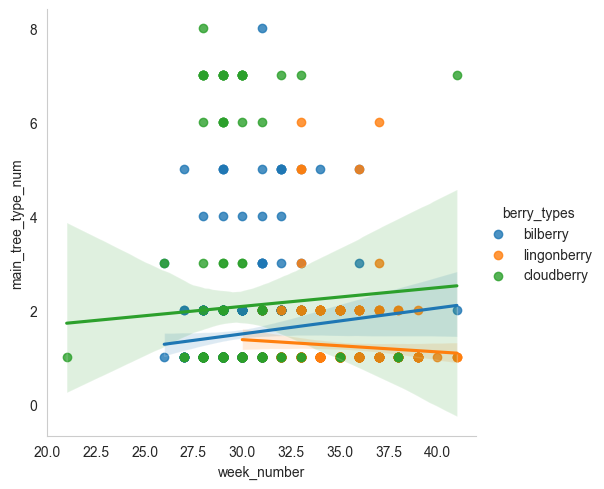

In [126]:
sns.lmplot(x='week_number', y='main_tree_type_num', data=df_simple, hue='berry_types')


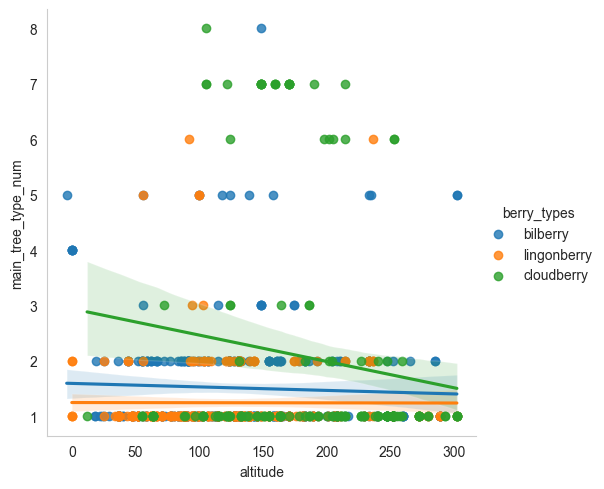

In [127]:
sns.lmplot(x='altitude', y='main_tree_type_num', data=df_simple, hue='berry_types')

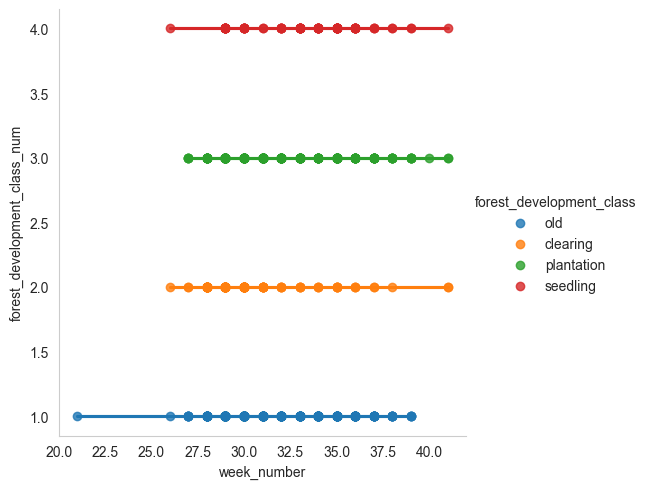

In [128]:
sns.lmplot(x='week_number', y='forest_development_class_num', data=df_simple, hue='forest_development_class')

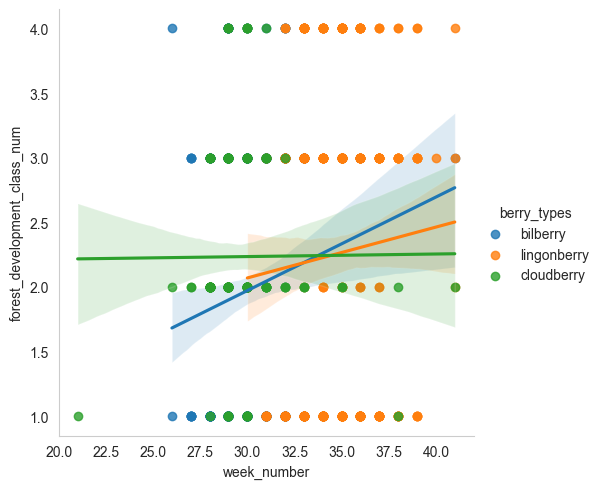

In [129]:
sns.lmplot(x='week_number', y='forest_development_class_num', data=df_simple, hue='berry_types')

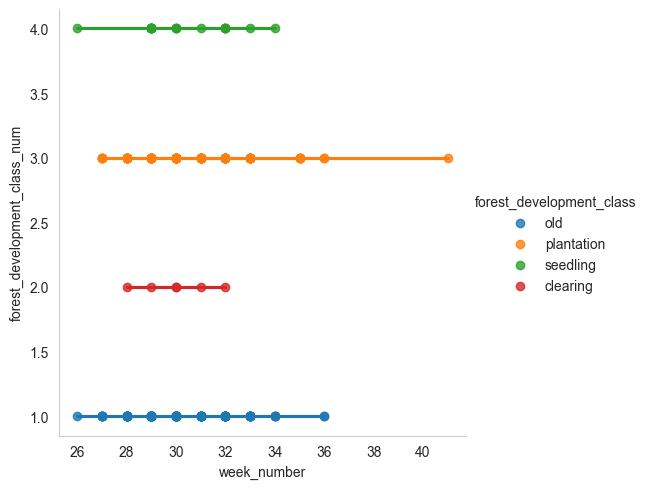

In [130]:
sns.lmplot(x='week_number', y='forest_development_class_num', data=df_bilberry, hue='forest_development_class')

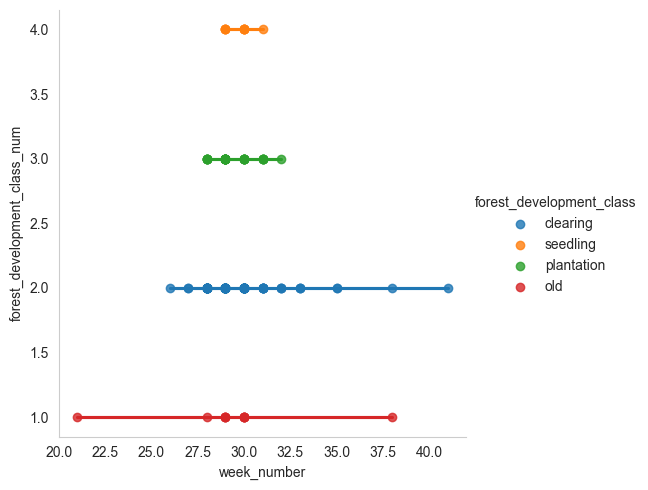

In [131]:
sns.lmplot(x='week_number', y='forest_development_class_num', data=df_cloudberry, hue='forest_development_class')

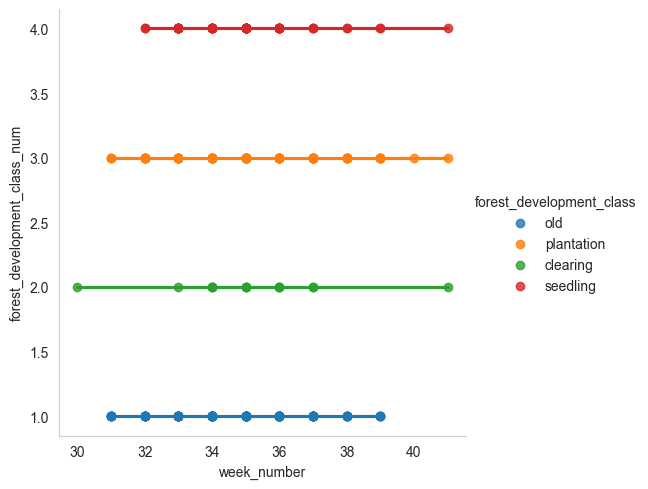

In [132]:
sns.lmplot(x='week_number', y='forest_development_class_num', data=df_lingonberry, hue='forest_development_class')

<AxesSubplot: xlabel='week_number', ylabel='forest_development_class_num'>

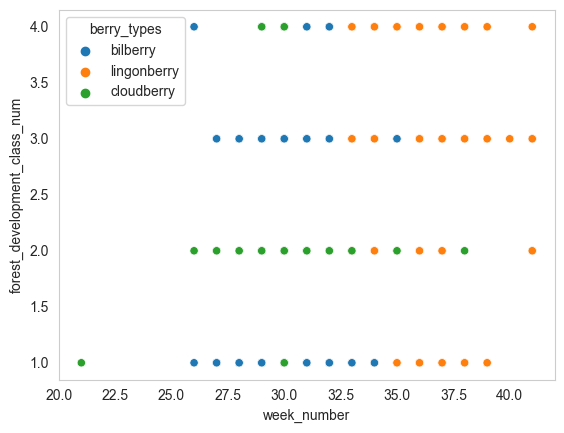

In [133]:
sns.scatterplot(x='week_number', y='forest_development_class_num', data=df_simple, hue='berry_types')

Text(0.5, 1.0, 'Temperatures vs Week numbers')

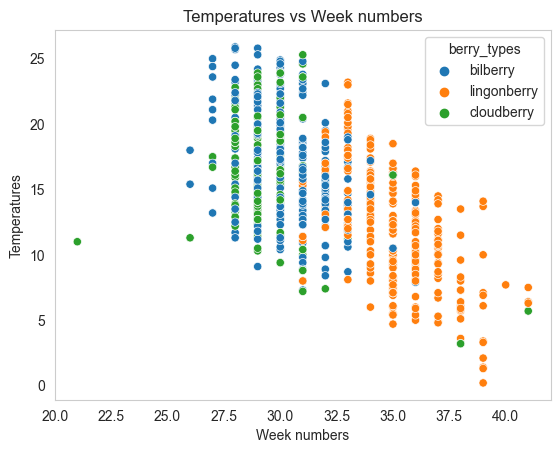

In [134]:
sns.scatterplot(x='week_number', y='temperature', data=df_simple, hue='berry_types')

plt.xlabel("Week numbers")
plt.ylabel("Temperatures")
plt.title("Temperatures vs Week numbers")

Bilberies grow spruce and boreal forest. grows shadowy locations than direct sunlights

Cloudberry sensitive subzero.

Lingon berries grow boreal forest and swamps.

In [135]:
df_simple[df_simple['year'] == 2018]['monthday'].min()

527

<AxesSubplot: xlabel='altitude', ylabel='week_number'>

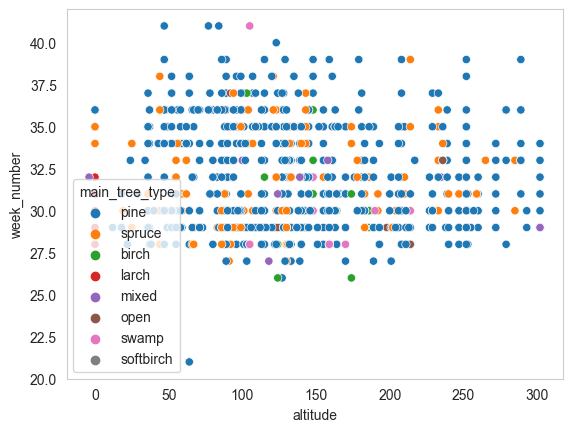

In [136]:
sns.scatterplot(x='altitude', y='week_number', data=df_simple, hue='main_tree_type')

<AxesSubplot: xlabel='monthday', ylabel='year'>

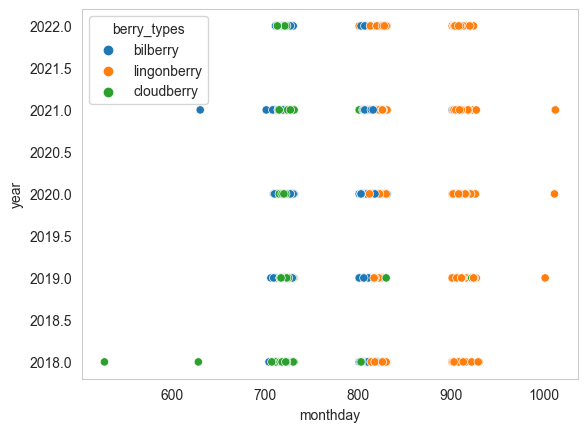

In [137]:
sns.scatterplot(x='monthday', y='year', data=df_simple, hue='berry_types')

<AxesSubplot: xlabel='region', ylabel='week_number'>

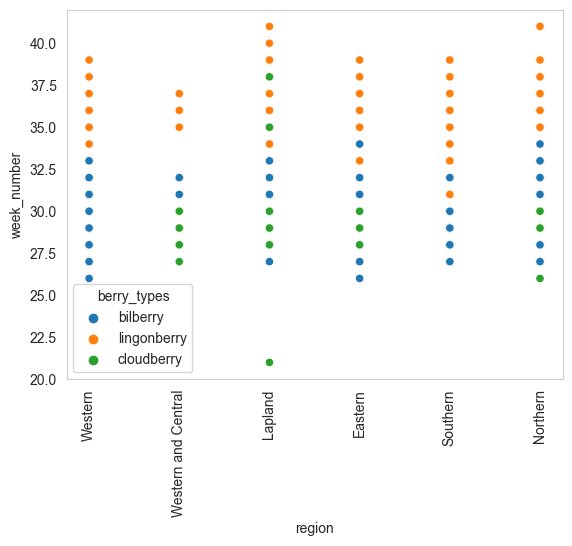

In [138]:
plt.xticks(rotation=90)
sns.scatterplot(x='region', y='week_number', data=df_simple, hue='berry_types')

<AxesSubplot: xlabel='region', ylabel='temperature'>

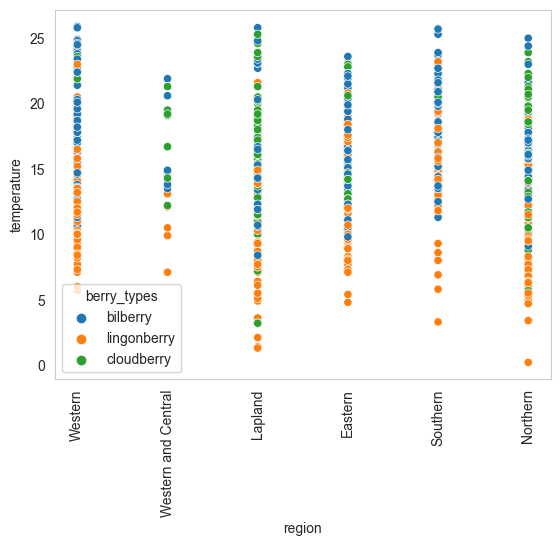

In [139]:
plt.xticks(rotation=90)
sns.scatterplot(x='region', y='temperature', data=df_simple, hue='berry_types')

<AxesSubplot: xlabel='altitude', ylabel='temperature'>

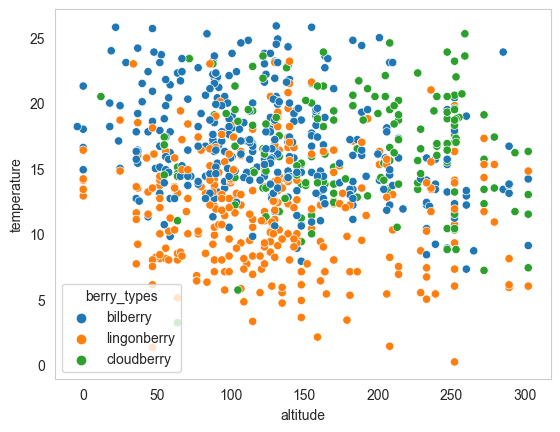

In [140]:
sns.scatterplot(x='altitude', y='temperature', data=df_simple, hue='berry_types')

<AxesSubplot: xlabel='year', ylabel='temperature'>

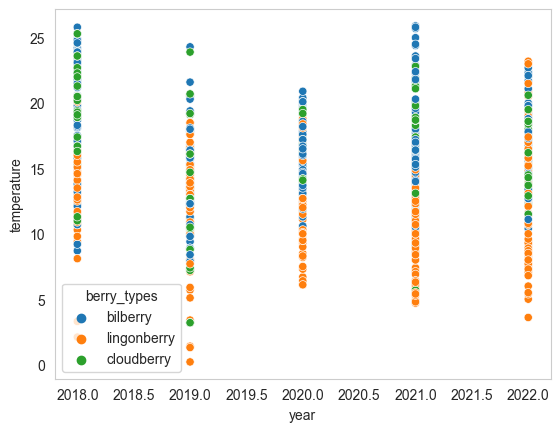

In [141]:
sns.scatterplot(x='year', y='temperature', data=df_simple, hue='berry_types')

<AxesSubplot: xlabel='year', ylabel='temperature'>

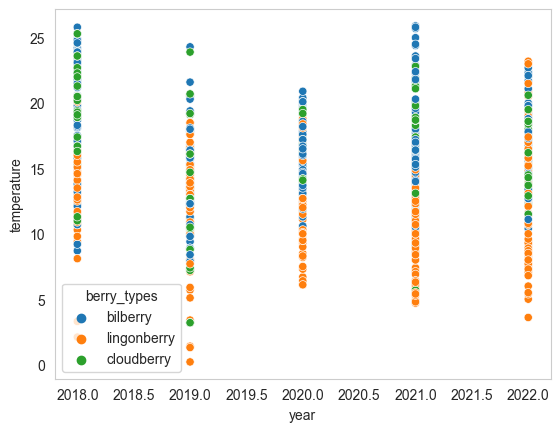

In [142]:
sns.scatterplot(x='year', y='temperature', data=df_simple, hue='berry_types')

<AxesSubplot: xlabel='year', ylabel='humidity'>

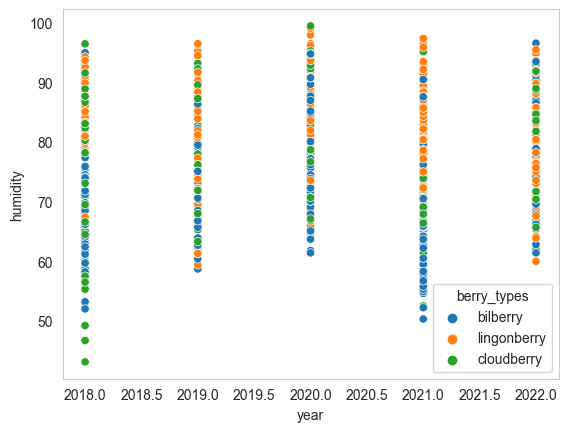

In [143]:
sns.scatterplot(x='year', y='humidity', data=df_simple, hue='berry_types')

<AxesSubplot: xlabel='monthday', ylabel='humidity'>

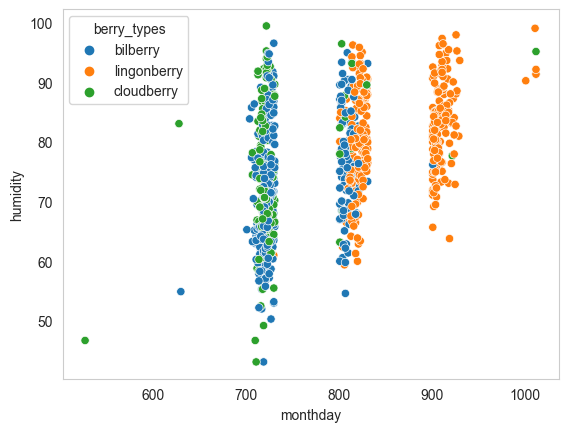

In [144]:
sns.scatterplot(x='monthday', y='humidity', data=df_simple, hue='berry_types')

<AxesSubplot: xlabel='observation_date', ylabel='temperature'>

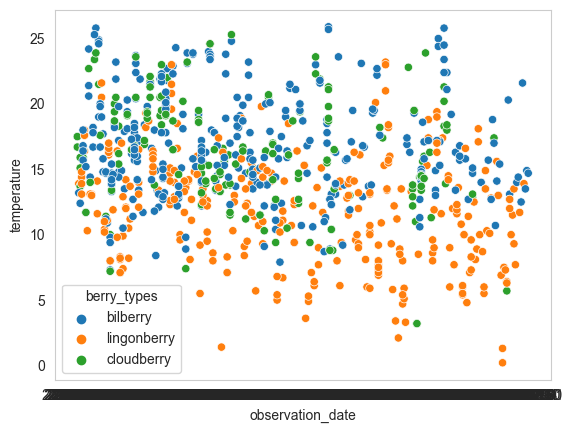

In [145]:
sns.scatterplot(x='observation_date', y='temperature', data=df_simple, hue='berry_types')

<AxesSubplot: xlabel='city_name', ylabel='berry_types'>

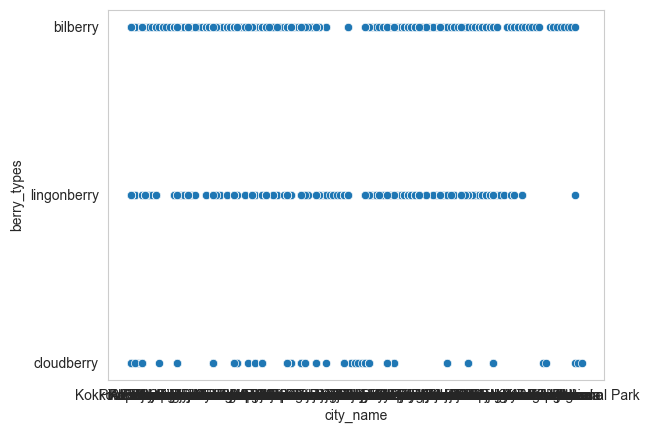

In [146]:
sns.scatterplot(x='city_name', y='berry_types',data=df_simple)

In [147]:
a = df_simple[['city_name','berry_types']]
(a['berry_types'] != 'bilberry').value_counts()


True     481
False    375
Name: berry_types, dtype: int64

In [148]:
df_simple.columns

Index(['berry_types', 'observation_date', 'main_tree_type',
       'forest_development_class', 'year', 'week_number', 'monthday', 'y', 'x',
       'temperature', 'dew', 'humidity', 'pressure', 'solarradiation',
       'solarenergy', 'uvindex', 'wd_pro_limit', 'wood_quality', 'city_name',
       'region', 'altitude', 'precip', 'precipprob', 'precipcover',
       'berry_x_num', 'main_tree_type_num', 'forest_development_class_num'],
      dtype='object')

In [149]:
non_bilberry_cities = df_simple[df_simple[['city_name', 'berry_types']]['berry_types'] != 'bilberry']
non_bilberry_cities

# groupby city name and berry_types to check

,berry_types,observation_date,main_tree_type,forest_development_class,year,week_number,monthday,y,x,temperature,...,wood_quality,city_name,region,altitude,precip,precipprob,precipcover,berry_x_num,main_tree_type_num,forest_development_class_num
1,lingonberry,2018-08-06,pine,old,2018,32,806,63.476942,25.193479,13.9,...,1.500000,Pihtipudas,Western,133,0.416,100,8.33,3,1,1
2,cloudberry,2018-07-07,pine,clearing,2018,27,707,63.476942,25.193479,17.5,...,1.500000,Pihtipudas,Western,133,0.000,0,0.00,2,1,2
4,lingonberry,2022-08-28,pine,old,2022,34,828,63.476942,25.193479,14.4,...,1.500000,Pihtipudas,Western,133,4.071,100,54.17,3,1,1
5,cloudberry,2022-07-16,pine,clearing,2022,28,716,63.476942,25.193479,13.7,...,1.500000,Pihtipudas,Western,133,0.000,0,0.00,2,1,2
7,lingonberry,2019-08-18,pine,old,2019,33,818,63.476942,25.193479,16.4,...,1.500000,Pihtipudas,Western,133,0.091,100,8.33,3,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
851,lingonberry,2020-08-12,spruce,seedling,2020,33,812,63.847317,27.000016,12.0,...,2.484848,Vierema,Eastern,178,0.000,0,0.00,3,2,4
852,cloudberry,2020-07-22,pine,old,2020,30,722,63.847317,27.000016,14.2,...,2.484848,Vierema,Eastern,178,2.386,100,58.33,2,1,1
853,cloudberry,2020-07-15,pine,seedling,2020,29,715,64.380480,28.243717,14.1,...,2.409091,Paltamo,Northern,204,0.000,0,0.00,2,1,4
854,cloudberry,2020-07-18,pine,clearing,2020,29,718,63.833034,24.967397,19.5,...,2.250000,Nivala,Northern,112,0.000,0,0.00,2,1,2


In [150]:
df_simple["observation_date"]

# dtype: object

0      2018-07-07
1      2018-08-06
2      2018-07-07
3      2022-07-16
4      2022-08-28
          ...    
851    2020-08-12
852    2020-07-22
853    2020-07-15
854    2020-07-18
855    2020-07-20
Name: observation_date, Length: 856, dtype: object

# Belows are plots for precipitation over years and weeks

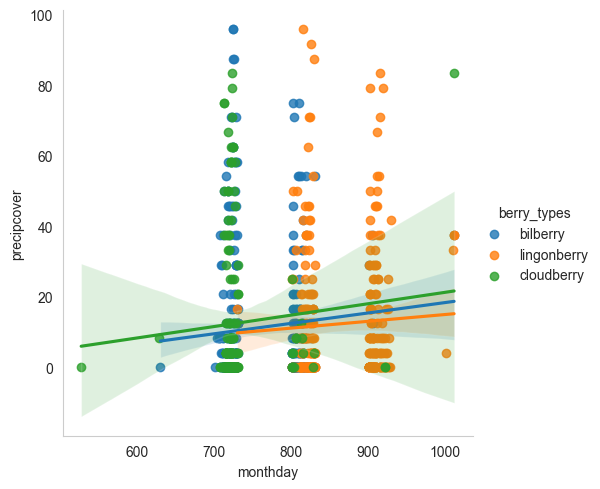

In [151]:
sns.lmplot(x='monthday', y='precipcover', data=df_simple, hue='berry_types')

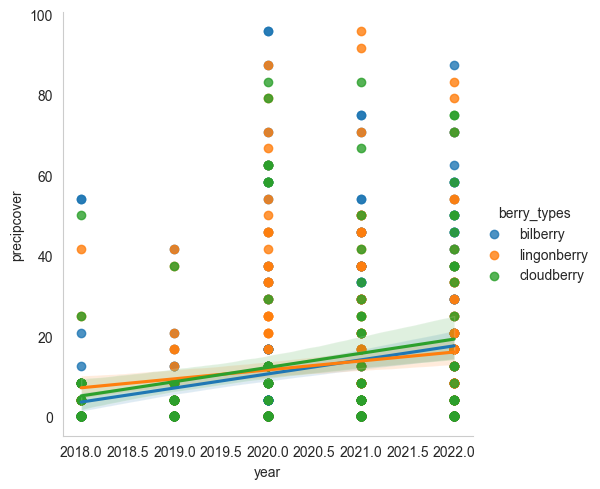

In [152]:
sns.lmplot(x='year', y='precipcover', data=df_simple, hue='berry_types')

<AxesSubplot: xlabel='year', ylabel='precipcover'>

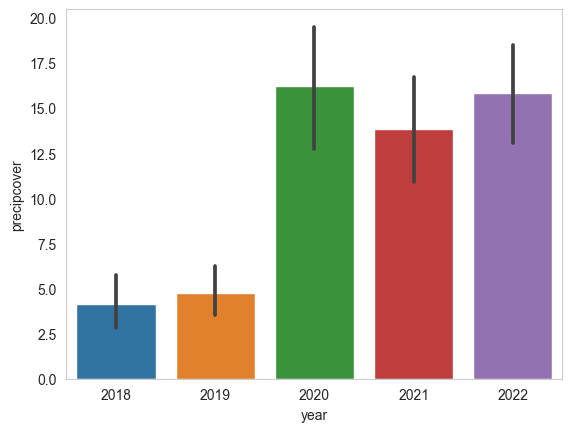

In [153]:
sns.barplot(x='year', y='precipcover', data=df_simple)

<AxesSubplot: xlabel='year', ylabel='precip'>

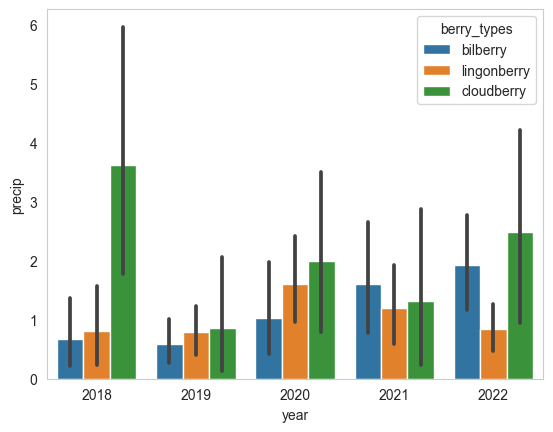

In [154]:
sns.barplot(x='year', y='precip', data=df_simple, hue='berry_types')

Text(0.5, 1.0, '2018 precipcover & weeks')

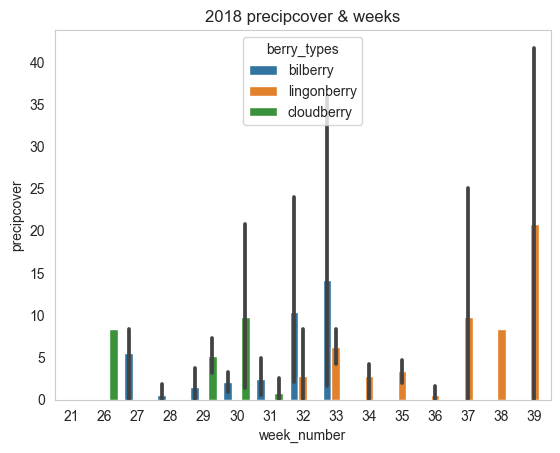

In [155]:
sns.barplot(x='week_number', y='precipcover', data=data_2018, hue='berry_types')
plt.title("2018 precipcover & weeks")

Text(0.5, 1.0, '2019 precipcover & weeks')

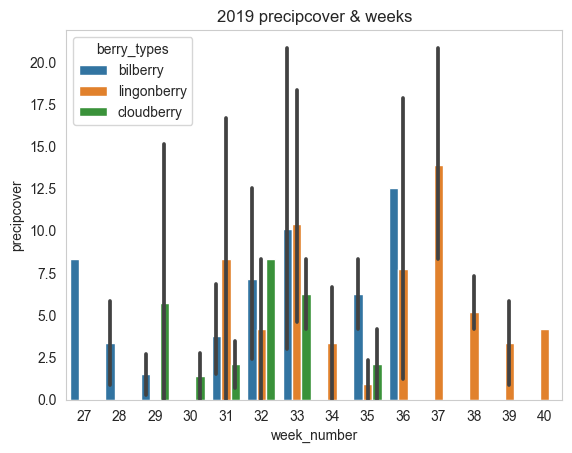

In [156]:
sns.barplot(x='week_number', y='precipcover', data=data_2019, hue='berry_types')
plt.title("2019 precipcover & weeks")

Text(0.5, 1.0, '2020 precipcover & weeks')

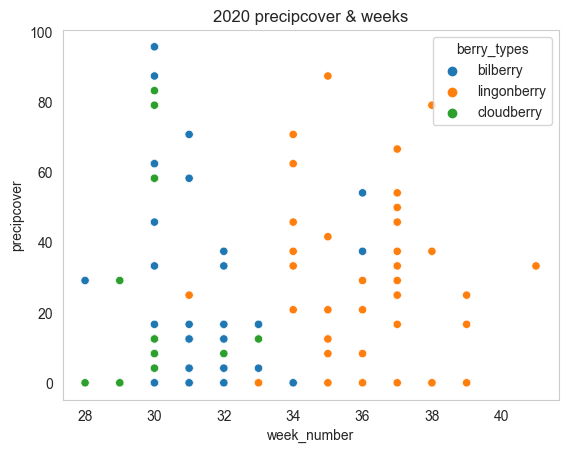

In [157]:
sns.scatterplot(x='week_number', y='precipcover', data=data_2020, hue='berry_types')
plt.title("2020 precipcover & weeks")

Text(0.5, 1.0, '2020 precipcover & weeks')

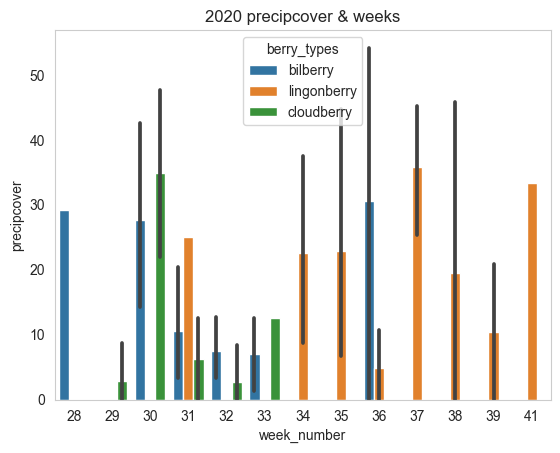

In [158]:
sns.barplot(x='week_number', y='precipcover', data=data_2020, hue='berry_types')
plt.title("2020 precipcover & weeks")

Text(0.5, 1.0, '2021 precipcover & weeks')

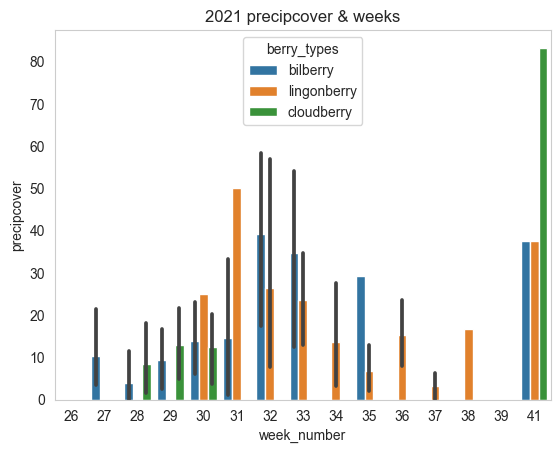

In [159]:
sns.barplot(x='week_number', y='precipcover', data=data_2021, hue='berry_types')
plt.title("2021 precipcover & weeks")

Text(0.5, 1.0, '2022 precipcover & weeks')

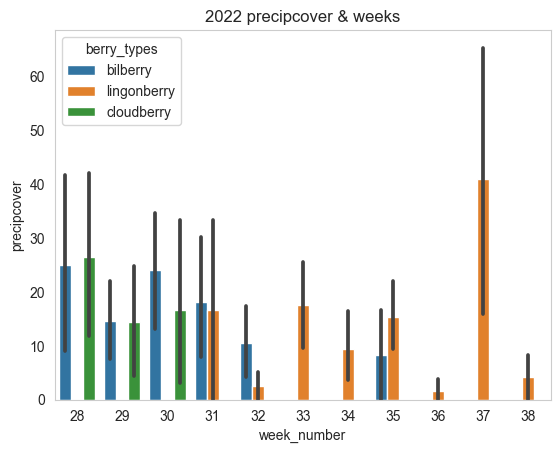

In [160]:
sns.barplot(x='week_number', y='precipcover', data=data_2022, hue='berry_types')
plt.title("2022 precipcover & weeks")

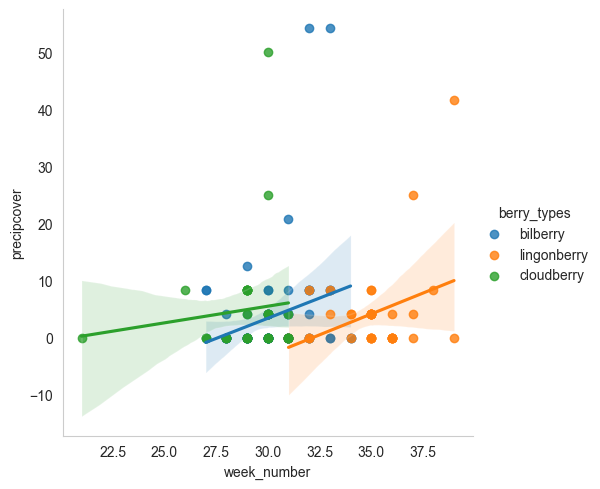

In [161]:
sns.lmplot(x='week_number', y='precipcover', data=data_2018, hue='berry_types')

<AxesSubplot: xlabel='year', ylabel='precipcover'>

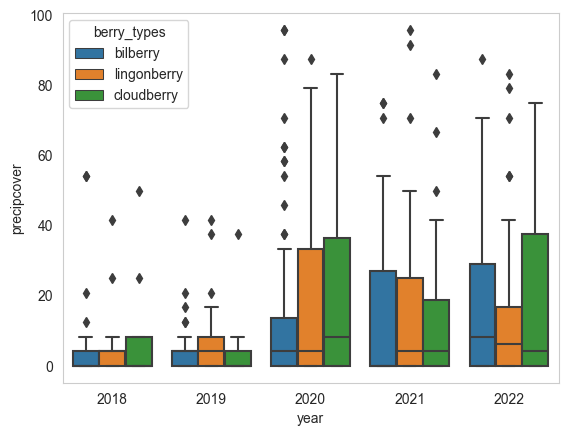

In [162]:
sns.boxplot(x='year', y='precipcover', data=df_simple, hue='berry_types')

<AxesSubplot: xlabel='year', ylabel='precip'>

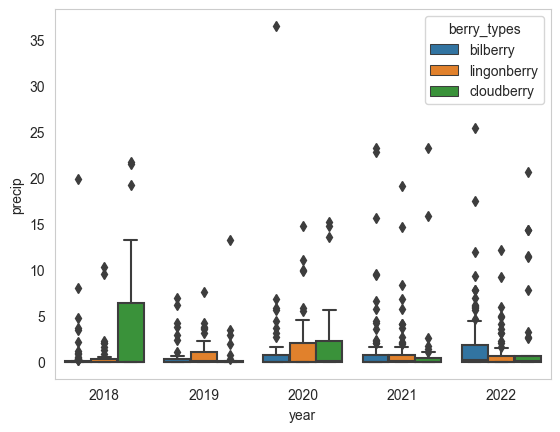

In [163]:
sns.boxplot(x='year', y='precip', data=df_simple, hue='berry_types')

<AxesSubplot: xlabel='berry_types', ylabel='precip'>

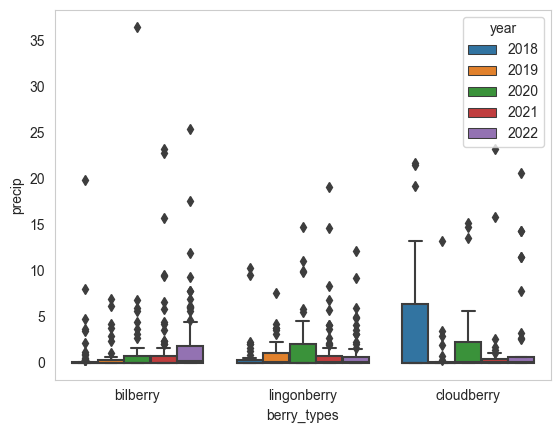

In [164]:
sns.boxplot(x='berry_types', y='precip', data=df_simple, hue='year')

# some ideas for additional data 

# effective temperature sum:
# https://www.ilmastokatsaus.fi/2019/06/19/2018-an-exceptionally-warm-thermal-growing-season-in-finland/#:~:text=The%20summer%20of%202018%20saw,more%20frequent%20in%20the%20future.

# for elevation data:
# https://www.opentopodata.org/

# NASA Power API
# needs more research, if it's usable or not


In [165]:
df_berry['year'].value_counts()

2022    203
2021    192
2020    188
2018    143
2019    130
Name: year, dtype: int64

In [166]:
# # playing around with effective temperature sum
# # further development, code a function/tool that 
# # processes all the years at one go for easier inspection

# df_2022 = df_berry_weather[df_berry_weather['year'] == 2022]

# df_2022_suitable = df_2022[df_2022['temperature'] > 5]
# df_2022_suitable['temperature'].count()

# temperature_sum_2022 = df_2022['temperature'].sum() - (df_2022['temperature'].count() * 5)
# average_temperature_sum = temperature_sum_2022 / df_2022['temperature'].count()
# average_temperature_sum

In [167]:
# # it seems 2018 was a very warm year
# # it should show in the monthday data and especially cloudberries
# df_2018 = df_berry_weather[df_berry_weather['year'] == 2018]

# df_2018_suitable = df_2018[df_2018['temperature'] > 5]
# df_2022_suitable['temperature'].count()

# temperature_sum_2018 = df_2018['temperature'].sum() - (df_2018['temperature'].count() * 5)
# average_temperature_sum = temperature_sum_2018 / df_2018['temperature'].count()
# average_temperature_sum

In [168]:
# sns.pairplot(df_everything, hue='berry_x')